In [3]:
import yaml
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import MultipleLocator
#import cmasher as cmr
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
from datetime import timedelta
from datetime import date

import IPython
notebook_name = "/".join(
        IPython.extract_module_locals()[1]["__vsc_ipynb_file__"].split("/")[-5:]
    )

#region: Plot formatting
mpl.rcParams['xtick.labelsize'] = 15
mpl.rcParams['ytick.labelsize'] = 15
mpl.rcParams['legend.fontsize'] = 13
mpl.rcParams['axes.labelsize'] = 20
mpl.rcParams['axes.titlesize'] = 22
mpl.rcParams['axes.xmargin'] = 0

# Set the font family to 'serif'
mpl.rcParams['font.family'] = 'serif'
# Specify preferred serif font (Computer Modern Roman is 'cmr10')
mpl.rcParams['font.serif'] = 'Lato' 
# Optionally, configure mathtext to use Computer Modern fonts as well
mpl.rcParams['mathtext.fontset'] = 'cm'
# Ensure minus signs are rendered correctly with CM fonts
mpl.rcParams['axes.unicode_minus'] = False

#Colorblind friendly colors in RGB:
forest_green_color = np.array([51,117,56])
bright_green_color = np.array([51, 117, 56])
indigo_color = np.array([46, 37, 133])
bright_blue_color = np.array([0, 114, 178])
light_blue_color = np.array([86, 180, 233])
pale_blue_color = np.array([148, 203, 236])
yellow_orange_color = np.array([230, 159, 0])
sunny_yellow_color = np.array([230, 159, 20])
lemon_yellow_color = np.array([240, 228, 66])
bright_orange_color = np.array([93, 168, 153])
desaturated_pink_color = np.array([194, 106, 119])
saturated_orchid_color = np.array([194, 106, 119])
purple_orchid_color = np.array([159, 74, 150])

def rgb_range_correction(color_names):
    mpl_formatted_colors = []
    for c in range(0,len(color_names)):
        rgb_division = color_names[c]/255
        mpl_formatted_colors.append(rgb_division)
    return mpl_formatted_colors

four_colorset1 = rgb_range_correction([forest_green_color, bright_blue_color, sunny_yellow_color, desaturated_pink_color])

#endregion

#read YAML files
dirpath = '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/'


In [4]:
run_number = '1'
mech_name = ['CB6r5h', 'CRACMM', 'GEOS-Chem']#, 'MCM']
start_date = date(2024, 7, 19)
end_date   = date(2024, 8, 12)

df_CB6r5h_species_conc = pd.DataFrame()
df_CRACMM_species_conc = pd.DataFrame()
df_GEOSChem_species_conc = pd.DataFrame()
# df_MCM_species_conc = pd.DataFrame()

df_CB6r5h_analysis = pd.DataFrame()
df_CRACMM_analysis = pd.DataFrame()
df_GEOSChem_analysis = pd.DataFrame()
# df_MCM_analysis = pd.DataFrame()

for mech in mech_name:
    date_count = start_date
    while date_count <= end_date:
        print(date_count)
        run_month = date_count.month
        run_day  = date_count.day
        run_date = str(run_month) + '_' + str(run_day) + '_' + '2024'
        yaml_usos_dirpath = dirpath + 'F0AM-4.4.2/Runs/USOS_' + run_date
        yaml_usos_full_filepath_species_conc = yaml_usos_dirpath + '/' + 'Run' + run_number + '/' + mech +'/USOS_' + run_date + '_' + mech + '_' + 'Run' + run_number + '_species_conc_output' + '.yaml'
        yaml_usos_full_filepath_analysis = yaml_usos_dirpath + '/' + 'Run' + run_number + '/' + mech +'/USOS_' + run_date + '_' + mech + '_' + 'Run' + run_number + '_analysis_output' + '.yaml'
        print(yaml_usos_full_filepath_analysis)

        with open(yaml_usos_full_filepath_species_conc, 'r') as f:
            yaml_usos_species_conc = yaml.full_load(f)
        with open(yaml_usos_full_filepath_analysis, 'r') as f:
            yaml_usos_analysis = yaml.full_load(f)

        processed_data_species_conc = {k: [item[0] if isinstance(item, list) else item for item in v] for k, v in yaml_usos_species_conc.items()}
        df_yaml_species_conc = pd.DataFrame(processed_data_species_conc)

        
        if mech == 'CB6r5h':
            df_CB6r5h_species_conc = pd.concat([df_CB6r5h_species_conc, df_yaml_species_conc], ignore_index=True)
        #     print(df_CB6r5h_analysis)
        #     print(df_yaml_analysis)
        #     df_CB6r5h_analysis = pd.concat([df_CB6r5h_analysis, df_yaml_analysis], ignore_index=True)
        elif mech == 'CRACMM':
            df_CRACMM_species_conc = pd.concat([df_CRACMM_species_conc, df_yaml_species_conc], ignore_index=True)
        #     print(df_CRACMM_analysis)
        #     #print(df_yaml_analysis)
        #     #df_CRACMM_analysis = pd.concat([df_CRACMM_analysis, df_yaml_analysis], ignore_index=True)

        elif mech == 'GEOS-Chem':
            df_GEOSChem_species_conc = pd.concat([df_GEOSChem_species_conc, df_yaml_species_conc], ignore_index=True)
        #     print(df_GEOSChem_analysis)
        #     #df_GEOSChem_analysis = pd.concat([df_GEOSChem_analysis, df_yaml_analysis], ignore_index=True)
        elif mech == 'MCM':
            df_MCM_species_conc = pd.concat([df_MCM_species_conc, df_yaml_species_conc], ignore_index=True)
        #     print(df_MCM_analysis)
        #     #df_MCM_analysis = pd.concat([df_MCM_analysis, df_yaml_analysis], ignore_index=True)
        else:
            print('Mechanism name invalid')
        
        date_count += timedelta(days=1)


2024-07-19
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_19_2024/Run1/CB6r5h/USOS_7_19_2024_CB6r5h_Run1_analysis_output.yaml
2024-07-20
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_20_2024/Run1/CB6r5h/USOS_7_20_2024_CB6r5h_Run1_analysis_output.yaml
2024-07-21
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_21_2024/Run1/CB6r5h/USOS_7_21_2024_CB6r5h_Run1_analysis_output.yaml
2024-07-22
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_22_2024/Run1/CB6r5h/USOS_7_22_2024_CB6r5h_Run1_analysis_output.yaml


2024-07-23
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_23_2024/Run1/CB6r5h/USOS_7_23_2024_CB6r5h_Run1_analysis_output.yaml
2024-07-24
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_24_2024/Run1/CB6r5h/USOS_7_24_2024_CB6r5h_Run1_analysis_output.yaml
2024-07-25
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_25_2024/Run1/CB6r5h/USOS_7_25_2024_CB6r5h_Run1_analysis_output.yaml
2024-07-26
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_26_2024/Run1/CB6r5h/USOS_7_26_2024_CB6r5h_Run1_analysis_output.yaml
2024-07-27
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_27_2024/Run1/CB6r5h/USOS_7_27_2024_CB6r5h_Run1_analysis_output.yaml
2024-07-28
/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_28_2024/Run1/CB6r5h/USOS_7_28_2024_C

In [5]:
new_start_time = pd.Timestamp('2024-07-19 00:00:00')
new_end_time = pd.Timestamp('2024-08-12 23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_index = pd.date_range(start=new_start_time, end=new_end_time, freq='15min', tz = 'America/Denver')

df_CB6r5h_hrly_species_conc = df_CB6r5h_species_conc.copy()
df_CRACMM_hrly_species_conc = df_CRACMM_species_conc.copy()
df_GEOSChem_hrly_species_conc = df_GEOSChem_species_conc.copy()
# df_MCM_hrly_species_conc = df_MCM_species_conc.copy()

df_CB6r5h_hrly_species_conc.set_index(new_index, inplace=True)
df_CRACMM_hrly_species_conc.set_index(new_index, inplace=True)
df_GEOSChem_hrly_species_conc.set_index(new_index, inplace=True)
# df_MCM_hrly_species_conc.set_index(new_index, inplace=True)

hour_range = np.arange(0,24,1)

In [6]:
df_CB6r5h_species_conc.set_index(new_index, inplace=True)
df_CRACMM_species_conc.set_index(new_index, inplace=True)
df_GEOSChem_species_conc.set_index(new_index, inplace=True)

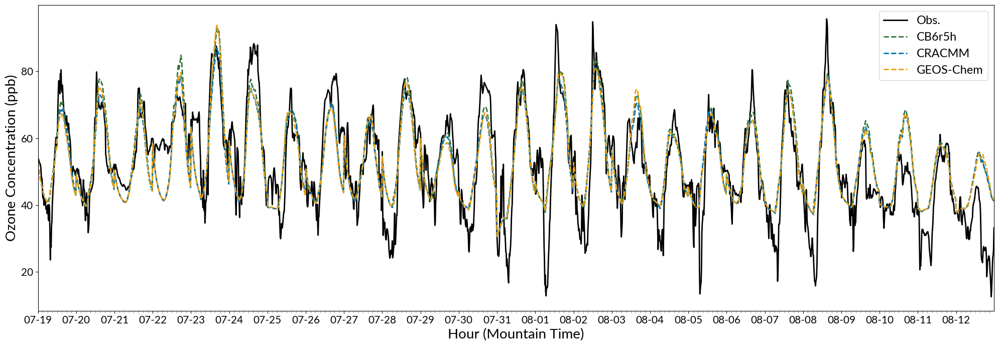

In [7]:
fig, ax = plt.subplots(figsize = (20,7), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index,df_CRACMM_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index,df_GEOSChem_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index,df_MCM_species_conc['O3conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

tz_mdt = df_CB6r5h_species_conc.index.tz
ax.xaxis.set_major_locator(mdates.DayLocator(tz = tz_mdt))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d', tz = tz_mdt))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21], tz = tz_mdt))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('Ozone Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_comparison_timeseries_07192024_08122024.png', dpi =150)
plt.show()

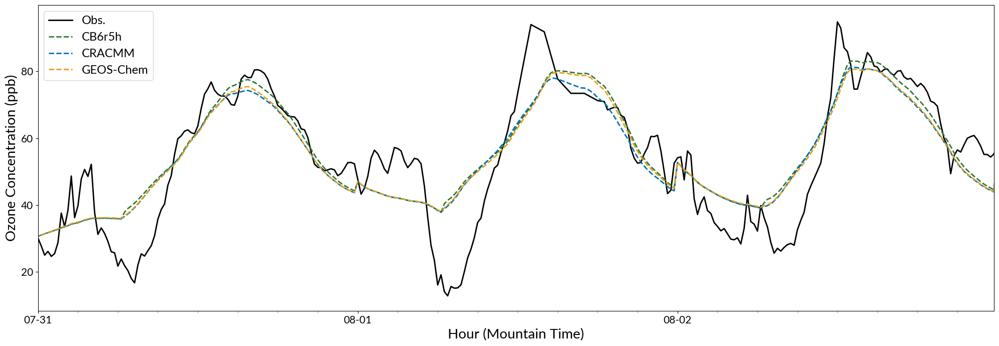

In [8]:
xlim_start = pd.to_datetime('2024-07-31 00:00:00').tz_localize('America/Denver')
xlim_end = pd.to_datetime('2024-08-02 23:45:00').tz_localize('America/Denver')
fig, ax = plt.subplots(figsize = (20,7), layout = 'tight')

plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index,df_CRACMM_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index,df_GEOSChem_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index,df_MCM_species_conc['O3conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

tz_mdt = df_CB6r5h_species_conc.index.tz
ax.xaxis.set_major_locator(mdates.DayLocator(tz = tz_mdt))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d', tz = tz_mdt))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21], tz = tz_mdt))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')
ax.set_xlim([xlim_start, xlim_end])

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('Ozone Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_comparison_timeseries_07312024_08022024.png', dpi =150)
plt.show()

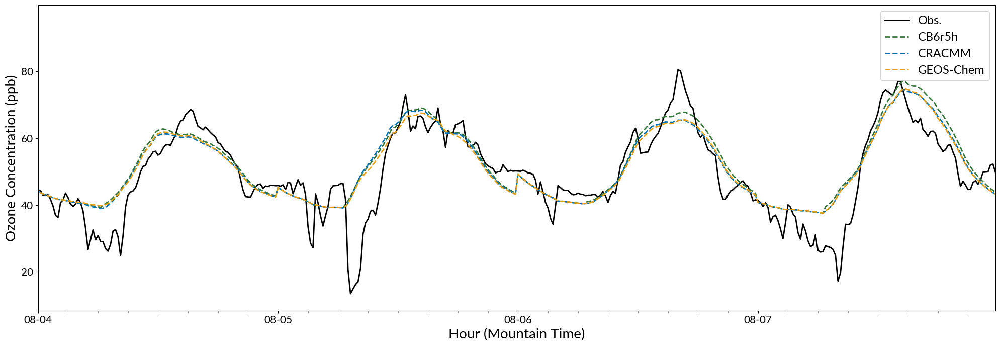

In [9]:
xlim_start = pd.to_datetime('2024-08-04 00:00:00').tz_localize('America/Denver')
xlim_end = pd.to_datetime('2024-08-07 23:45:00').tz_localize('America/Denver')
fig, ax = plt.subplots(figsize = (20,7), layout = 'tight')

plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index,df_CRACMM_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index,df_GEOSChem_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index,df_MCM_species_conc['O3conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

tz_mdt = df_CB6r5h_species_conc.index.tz
ax.xaxis.set_major_locator(mdates.DayLocator(tz = tz_mdt))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d', tz = tz_mdt))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21], tz = tz_mdt))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')
ax.set_xlim([xlim_start, xlim_end])

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('Ozone Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

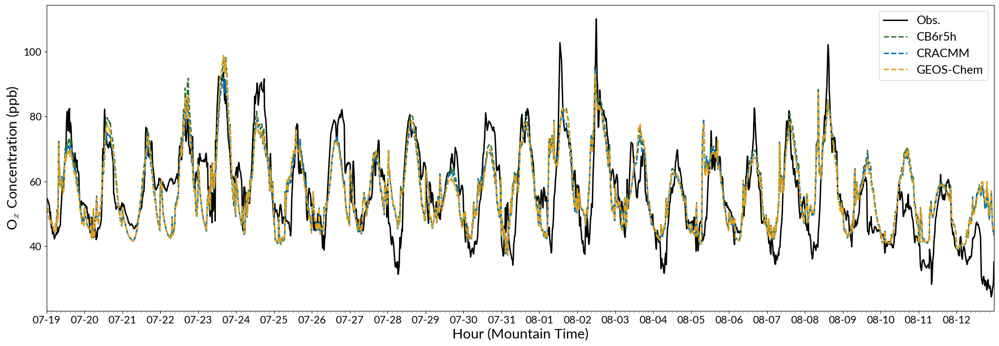

In [10]:
fig, ax = plt.subplots(figsize = (20,7), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc']+2*df_CB6r5h_species_conc['NO3Initconc']+3*df_CB6r5h_species_conc['N2O5Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc']+2*df_CB6r5h_species_conc['NO3conc']+3*df_CB6r5h_species_conc['N2O5conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc']+2*df_CRACMM_species_conc['NO3conc']+3*df_CRACMM_species_conc['N2O5conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc']+2*df_GEOSChem_species_conc['NO3conc']+3*df_GEOSChem_species_conc['N2O5conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index, df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

tz_mdt = df_CB6r5h_species_conc.index.tz
ax.xaxis.set_major_locator(mdates.DayLocator(tz = tz_mdt))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d', tz = tz_mdt))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21], tz = tz_mdt))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('O$_x$ Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ox_conc_mechanism_comparison_timeseries_07192024_08122024.png', dpi =150)
plt.show()

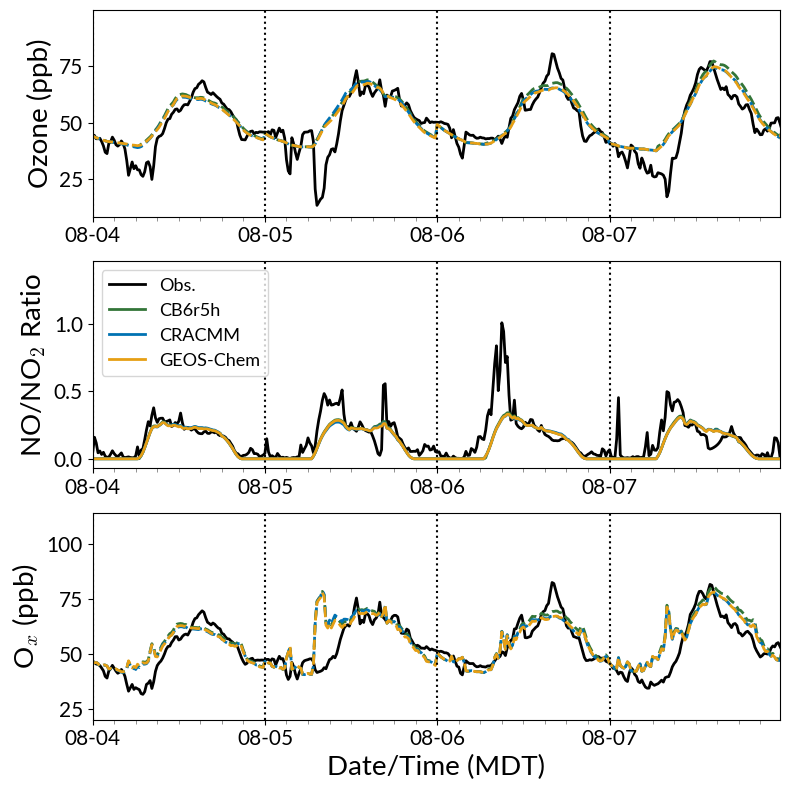

In [82]:
fig, (ax1, ax2, ax3) = plt.subplots(3,1, figsize = (8,8), tight_layout=True)
xlim_start = pd.to_datetime('2024-08-04 00:00:00').tz_localize('America/Denver')
xlim_end = pd.to_datetime('2024-08-07 23:45:00').tz_localize('America/Denver')

plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

ax1.plot(new_index, df_CB6r5h_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
ax1.plot(new_index, df_CB6r5h_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
ax1.plot(new_index,df_CRACMM_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
ax1.plot(new_index,df_GEOSChem_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index,df_MCM_species_conc['O3conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

tz_mdt = df_CB6r5h_species_conc.index.tz
ax1.xaxis.set_major_locator(mdates.DayLocator(tz = tz_mdt))
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d', tz = tz_mdt))
# Minor ticks: every 3 hours
ax1.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21], tz = tz_mdt))
# Rotate and format tick labels
ax1.tick_params(axis='x', which='major')
ax1.tick_params(axis='x', which='minor', length=3, color='gray')
ax1.set_xlim([xlim_start, xlim_end])
ax1.set_ylabel('Ozone (ppb)')

# axin = ax1.inset_axes([0.6, 1, 0.2, 0.2])

# axin.set_xlim([pd.to_datetime('2024-08-06 12:00:00').tz_localize('America/Denver'), pd.to_datetime('2024-08-06 23:00:00').tz_localize('America/Denver')])
# axin.set_ylim(50, 60)
# axin.plot(new_index, df_CB6r5h_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
# axin.plot(new_index,df_CRACMM_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
# axin.plot(new_index,df_GEOSChem_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# axin.tick_params(axis='x', labelsize=10)
# axin.tick_params(axis='y', labelsize=10)
# axin.xaxis.set_major_locator(mdates.HourLocator())
# axin.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
# axin.set_ylim(50, 80)
# ax1.indicate_inset_zoom(axin)

ax2.plot(new_index, df_CB6r5h_species_conc['NOInitconc']/df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
ax2.plot(new_index, df_CB6r5h_species_conc['NOconc']/df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
ax2.plot(new_index, df_CRACMM_species_conc['NOconc']/df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
ax2.plot(new_index, df_GEOSChem_species_conc['NOconc']/df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())

ax2.xaxis.set_major_locator(mdates.DayLocator(tz = tz_mdt))
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d', tz = tz_mdt))
# Minor ticks: every 3 hours
ax2.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21], tz = tz_mdt))
# Rotate and format tick labels
ax2.tick_params(axis='x', which='major')
ax2.tick_params(axis='x', which='minor', length=3, color='gray')
ax2.set_xlim([xlim_start, xlim_end])
ax2.set_ylabel('Ozone (ppb)')
ax2.set_ylabel('NO/NO$_2$ Ratio')
ax2.set_xlim([xlim_start, xlim_end])
ax2.legend(loc = 'upper left')

ax3.plot(new_index, df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc']+2*df_CB6r5h_species_conc['NO3Initconc']+3*df_CB6r5h_species_conc['N2O5Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
ax3.plot(new_index, df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc']+2*df_CB6r5h_species_conc['NO3conc']+3*df_CB6r5h_species_conc['N2O5conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
ax3.plot(new_index, df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc']+2*df_CRACMM_species_conc['NO3conc']+3*df_CRACMM_species_conc['N2O5conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
ax3.plot(new_index, df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc']+2*df_GEOSChem_species_conc['NO3conc']+3*df_GEOSChem_species_conc['N2O5conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())

ax3.xaxis.set_major_locator(mdates.DayLocator(tz = tz_mdt))
ax3.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d', tz = tz_mdt))
# Minor ticks: every 3 hours
ax3.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21], tz = tz_mdt))
# Rotate and format tick labels
ax3.tick_params(axis='x', which='major')
ax3.tick_params(axis='x', which='minor', length=3, color='gray')
ax3.set_xlim([xlim_start, xlim_end])
ax1.set_ylabel('Ozone (ppb)')
ax3.set_ylabel('O$_x$ (ppb)')
ax3.set_xlim([xlim_start, xlim_end])

ax3.set_xlabel('Date/Time (MDT)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax1.axvline(day_pos, color = 'black', linestyle = 'dotted')
    ax2.axvline(day_pos, color = 'black', linestyle = 'dotted')
    ax3.axvline(day_pos, color = 'black', linestyle = 'dotted')

# plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_no_no2_ratio_ox_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

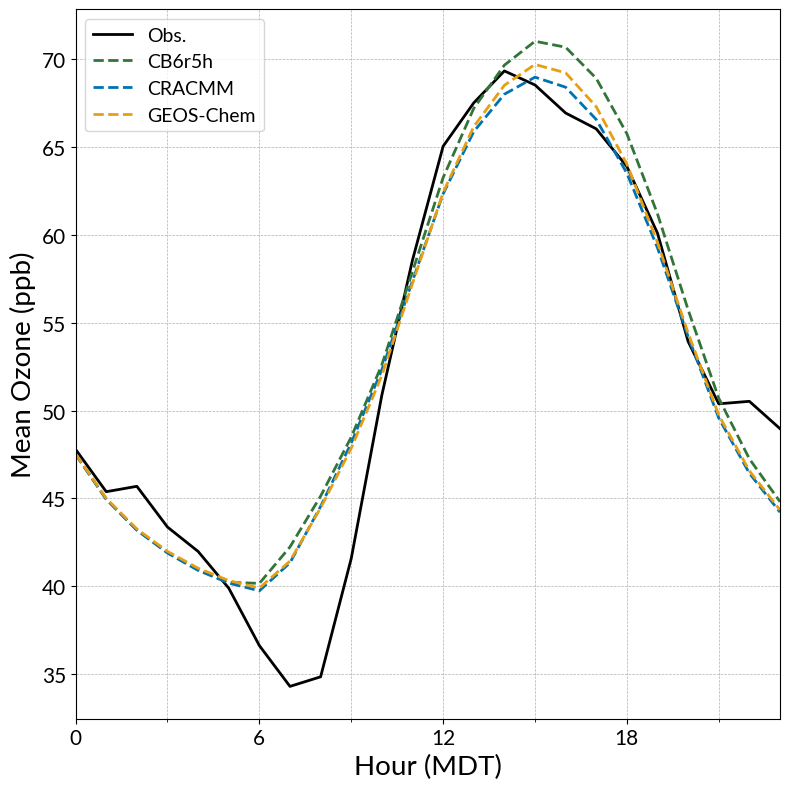

In [69]:
#Put data into hour-of-day bin
df_CB6r5h_hrly_species_conc['hour'] = df_CB6r5h_hrly_species_conc.index.hour
df_CRACMM_hrly_species_conc['hour'] = df_CRACMM_hrly_species_conc.index.hour
df_GEOSChem_hrly_species_conc['hour'] = df_GEOSChem_hrly_species_conc.index.hour
#df_MCM_hrly_species_conc['hour'] = df_MCM_hrly_species_conc.index.hour

#Group by hour and take mean per species
df_CB6r5h_hourly_means_species_conc = df_CB6r5h_hrly_species_conc.groupby('hour').mean()
df_CRACMM_hourly_means_species_conc = df_CRACMM_hrly_species_conc.groupby('hour').mean()
df_GEOSChem_hourly_means_species_conc = df_GEOSChem_hrly_species_conc.groupby('hour').mean()
#df_MCM_hourly_means_species_conc = df_MCM_hrly_species_conc.groupby('hour').mean()

fig, ax = plt.subplots(figsize = (8,8), layout = 'tight')

plt.plot(hour_range, df_CB6r5h_hourly_means_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(hour_range, df_CB6r5h_hourly_means_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(hour_range, df_CRACMM_hourly_means_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(hour_range, df_GEOSChem_hourly_means_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
#plt.plot(hour_range, df_MCM_hourly_means_species_conc['O3conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

#ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
ax.xaxis.set_minor_locator(MultipleLocator(3))
ax.xaxis.set_major_locator(MultipleLocator(6))
plt.xlabel('Hour (MDT)')
plt.xticks(np.arange(0,24,6))
ax.grid(which='both', linestyle='--', linewidth=0.5)
plt.margins(x=0)

plt.ylabel('Mean Ozone (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_avg_hourly_comparison_07192024_08122024.png', dpi =150)
plt.show()

In [53]:
def mda8_calculate(save_filename):
    df_o3_obs = df_CB6r5h_species_conc
    mda8_index_start = pd.to_datetime('2024-07-19 00:00:00').tz_localize('America/Denver')
    mda8_index_end = pd.to_datetime('2024-08-12 23:00:00').tz_localize('America/Denver')
    mda8_new_index = pd.date_range(start=mda8_index_start, end=mda8_index_end, freq='1h')
    mda8_data = df_o3_obs.reindex(mda8_new_index)
    #print(mda8_data)
    #MDA8 Calculation

    # Calculate the 8-hour rolling average
    rolling_avg_name = '8hr_rolling_avg_' + 'O3 obs'
    mda8_data[rolling_avg_name] = mda8_data['O3Initconc'].rolling(window=8, min_periods=6).mean()
    #print(mda8_data['8hr_rolling_avg_O3 obs'])

    #rolling average only works for 8 hours with no gaps; at least 6 hours

    # Calculate the maximum 8-hour average for each day
    # Resample to daily frequency, compute the daily max of the rolling averages, drop NA values
    daily_max_8hr_avg_ozone = mda8_data[rolling_avg_name].resample('D').max().dropna()

    daily_max_8hr_avg_ozone.index.name = "date"
    daily8hrmax_ozone_savepath = dirpath + 'F0AM_run_analysis/daily8hrmax_ozone.csv'
    daily_max_8hr_avg_ozone.to_csv(daily8hrmax_ozone_savepath)

    # Map the daily maximum back to the original dataframe
    # Create a new temporary column with the daily max 8-hour average for each timestamp
    mda8_ozone_name = 'MDA8_O3_' + 'obs'
    mda8_data[mda8_ozone_name] = mda8_data.index.floor('D').map(daily_max_8hr_avg_ozone)


    # # Select daytime values only where MD8A > 70
    exceedance_name = 'Exceedance_day_' + 'O3'
    mda8_data[exceedance_name] = mda8_data[mda8_ozone_name] >= 70

    df_mda8_ozone = mda8_data
    df_mda8_ozone.index.name = 'time_local'
    savepath = dirpath + 'F0AM_run_analysis/' + save_filename + '.csv'
    df_mda8_ozone.to_csv(savepath)
    print('Saved to:' + savepath)

#MDA8 Ozone - has index from 2024-07-16 12:00:00 to 2024-08-18 18:00:00
mda8_calculate(save_filename = 'mda8_o3_df')

mda8_ozone_filepath = dirpath + 'F0AM_run_analysis/mda8_o3_df.csv'
df_mda8_o3_data = pd.read_csv(mda8_ozone_filepath, index_col = 'time_local', parse_dates=True)

daily8hrmax_ozone_filepath = dirpath + 'F0AM_run_analysis/daily8hrmax_ozone.csv'
df_daily8hrmax_ozone = pd.read_csv(daily8hrmax_ozone_filepath, index_col = 'date', parse_dates=True)
daily_max_8hr_avg_ozone = df_daily8hrmax_ozone['8hr_rolling_avg_O3 obs']

threshold = 70
# mda8_exceedance = np.where(daily_max_8hr_avg_ozone > threshold, daily_max_8hr_avg_ozone, np.nan)

mda8_exceedance = daily_max_8hr_avg_ozone[daily_max_8hr_avg_ozone > threshold].index

print(mda8_exceedance)

Saved to:/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM_run_analysis/mda8_o3_df.csv
DatetimeIndex(['2024-07-23 00:00:00-06:00', '2024-07-24 00:00:00-06:00',
               '2024-07-26 00:00:00-06:00', '2024-07-28 00:00:00-06:00',
               '2024-07-30 00:00:00-06:00', '2024-07-31 00:00:00-06:00',
               '2024-08-01 00:00:00-06:00', '2024-08-02 00:00:00-06:00',
               '2024-08-08 00:00:00-06:00'],
              dtype='datetime64[ns, UTC-06:00]', name='date', freq=None)


In [ ]:
from usos_dictionaries import voc_available_days_dict

exceedance_date_list = voc_available_days_dict['Exceedance_days']

df_filtered_CB6r5h_hrly_species_conc = df_CB6r5h_hrly_species_conc[df_CB6r5h_hrly_species_conc.index.floor('D').isin(exceedance_date_list)]
df_filtered_CRACMM_hrly_species_conc = df_CRACMM_hrly_species_conc[df_CRACMM_hrly_species_conc.index.floor('D').isin(exceedance_date_list)]
df_filtered_GEOSChem_hrly_species_conc = df_GEOSChem_hrly_species_conc[df_GEOSChem_hrly_species_conc.index.floor('D').isin(exceedance_date_list)]

df_filtered_CB6r5h_hrly_species_conc['hour'] = df_filtered_CB6r5h_hrly_species_conc.index.hour
df_filtered_CRACMM_hrly_species_conc['hour'] = df_filtered_CRACMM_hrly_species_conc.index.hour
df_filtered_GEOSChem_hrly_species_conc['hour'] = df_filtered_GEOSChem_hrly_species_conc.index.hour

#Group by hour and take mean per species
df_filtered_CB6r5h_hourly_means_species_conc = df_filtered_CB6r5h_hrly_species_conc.groupby('hour').mean()
df_filtered_CRACMM_hourly_means_species_conc = df_filtered_CRACMM_hrly_species_conc.groupby('hour').mean()
df_filtered_GEOSChem_hourly_means_species_conc = df_filtered_GEOSChem_hrly_species_conc.groupby('hour').mean()

# print(df_filtered_CB6r5h_hourly_means_species_conc)

# #df_MCM_hourly_means_species_conc = df_MCM_hrly_species_conc.groupby('hour').mean()

# fig, (ax1, ax2) = plt.subplots(1,2, figsize = (7,5), tight_layout=True)
# ax1.plot(hour_range, df_CB6r5h_hourly_means_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
# ax1.plot(hour_range, df_CB6r5h_hourly_means_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
# ax1.plot(hour_range, df_CRACMM_hourly_means_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
# ax1.plot(hour_range, df_GEOSChem_hourly_means_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# ax1.set_title('All days')
# ax1.set_ylabel('Mean Ozone (ppb)')
# ax1.set_ylim([28, 85])
# ax1.set_xlabel('Hour (MDT)')

# #ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# ax1.xaxis.set_minor_locator(MultipleLocator(3))
# ax1.xaxis.set_major_locator(MultipleLocator(6))

# ax2.plot(hour_range, df_filtered_CB6r5h_hourly_means_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
# ax2.plot(hour_range, df_filtered_CB6r5h_hourly_means_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
# ax2.plot(hour_range, df_filtered_CRACMM_hourly_means_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
# ax2.plot(hour_range, df_filtered_GEOSChem_hourly_means_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# ax2.set_title('Exceedance days')

# #ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# ax2.xaxis.set_minor_locator(MultipleLocator(3))
# ax2.xaxis.set_major_locator(MultipleLocator(6))
# ax2.set_ylim([28, 85])

# ax2.set_xlabel('Hour (MDT)')
# plt.xticks(np.arange(0,24,6))

# ax1.grid(which='both', linestyle='--', linewidth=0.5)
# ax2.grid(which='both', linestyle='--', linewidth=0.5)

# plt.margins(x=0)


# # plt.legend()
# #plt.title('Hourly Mean Ozone Between \n Chemical Mechanisms \nfor Exceedance Days\n')
# plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_hourly_comparison_exceedance_days_and_avg.png', dpi =150)
# plt.show()

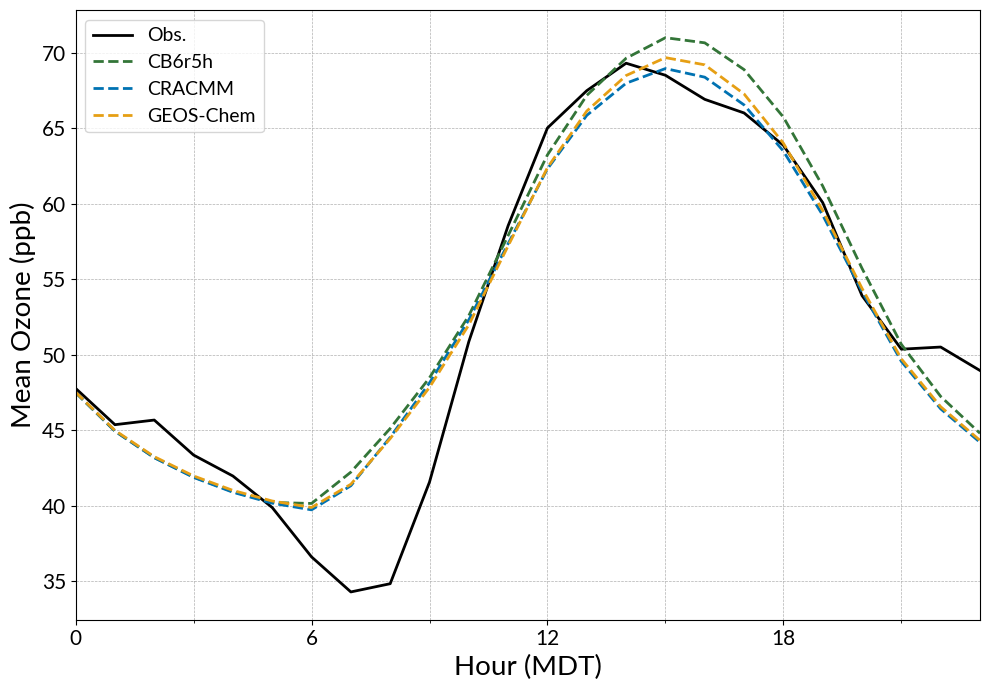

In [68]:
#Average for an exceedance day

df_CB6r5h_hrly_species_conc['hour'] = df_CB6r5h_hrly_species_conc.index.hour
df_CRACMM_hrly_species_conc['hour'] = df_CRACMM_hrly_species_conc.index.hour
df_GEOSChem_hrly_species_conc['hour'] = df_GEOSChem_hrly_species_conc.index.hour
#df_MCM_hrly_species_conc['hour'] = df_MCM_hrly_species_conc.index.hour

#Group by hour and take mean per species
df_CB6r5h_hourly_means_species_conc = df_CB6r5h_hrly_species_conc.groupby('hour').mean()
df_CRACMM_hourly_means_species_conc = df_CRACMM_hrly_species_conc.groupby('hour').mean()
df_GEOSChem_hourly_means_species_conc = df_GEOSChem_hrly_species_conc.groupby('hour').mean()
#df_MCM_hourly_means_species_conc = df_MCM_hrly_species_conc.groupby('hour').mean()

fig, ax = plt.subplots(figsize = (10,7), layout = 'tight')

plt.plot(hour_range, df_CB6r5h_hourly_means_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(hour_range, df_CB6r5h_hourly_means_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(hour_range, df_CRACMM_hourly_means_species_conc['O3conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(hour_range, df_GEOSChem_hourly_means_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
#plt.plot(hour_range, df_MCM_hourly_means_species_conc['O3conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

#ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
ax.xaxis.set_minor_locator(MultipleLocator(3))
ax.xaxis.set_major_locator(MultipleLocator(6))
plt.xlabel('Hour (MDT)')
plt.xticks(np.arange(0,24,6))
ax.grid(which='both', linestyle='--', linewidth=0.5)
plt.margins(x=0)

plt.ylabel('Mean Ozone (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_avg_hourly_comparison_07192024_08122024.png', dpi =150)
plt.show()

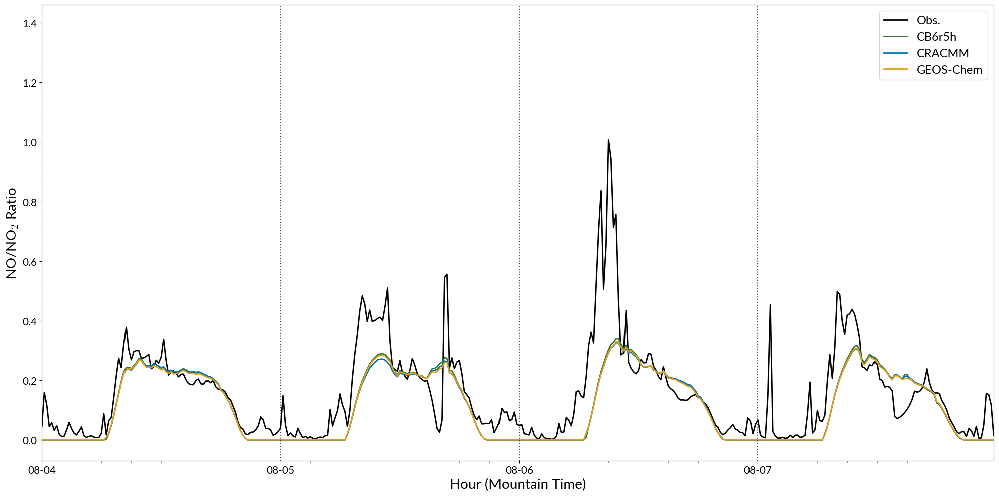

In [47]:
xlim_start = pd.to_datetime('2024-08-04 00:00:00').tz_localize('America/Denver')
xlim_end = pd.to_datetime('2024-08-07 23:45:00').tz_localize('America/Denver')

fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['NOInitconc']/df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['NOconc']/df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['NOconc']/df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['NOconc']/df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index, df_MCM_species_conc['NOconc']/df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

tz_mdt = df_CB6r5h_species_conc.index.tz
ax.xaxis.set_major_locator(mdates.DayLocator(tz = tz_mdt))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d', tz = tz_mdt))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21], tz = tz_mdt))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')
ax.set_xlim([xlim_start, xlim_end])

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('NO/NO$_2$ Ratio')
plt.legend()
plt.savefig(dirpath + '/F0AM_run_analysis/plots/no_no2_ratio_mechanism_comparison_timeseries_07192024_08122024.png', dpi =150)
plt.show()

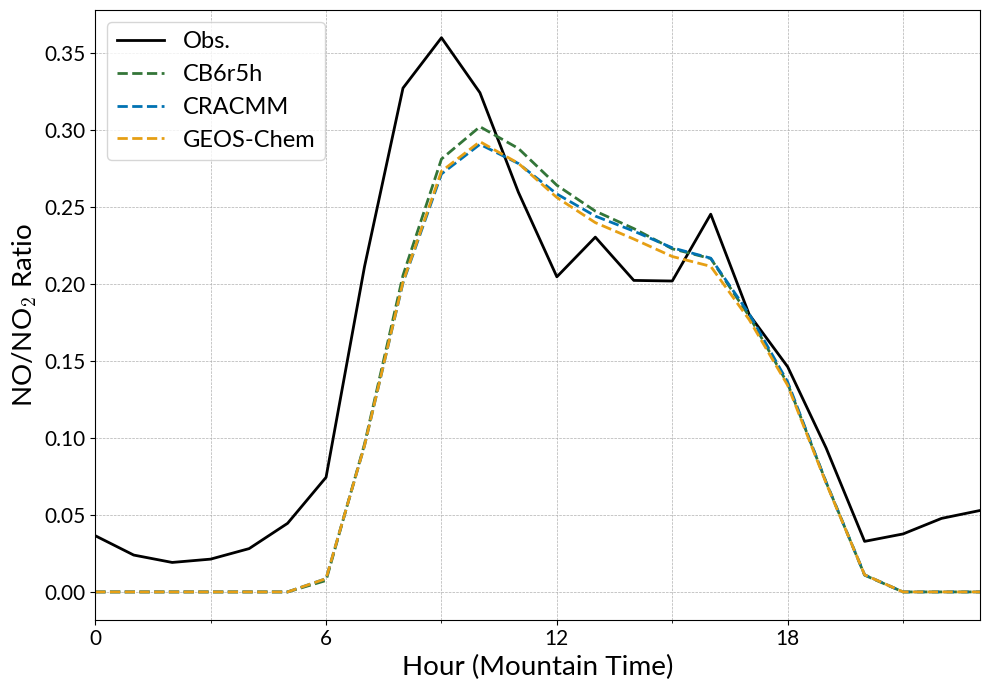

In [50]:
new_start_time = pd.Timestamp('2024-07-19 00:00:00')
new_end_time = pd.Timestamp('2024-08-12 23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_index = pd.date_range(start=new_start_time, end=new_end_time, freq='15min', tz = 'America/Denver')

df_CB6r5h_hrly_species_conc = df_CB6r5h_species_conc.copy()
df_CRACMM_hrly_species_conc = df_CRACMM_species_conc.copy()
df_GEOSChem_hrly_species_conc = df_GEOSChem_species_conc.copy()
# df_MCM_hrly_species_conc = df_MCM_species_conc.copy()

df_CB6r5h_hrly_species_conc.set_index(new_index, inplace=True)
df_CRACMM_hrly_species_conc.set_index(new_index, inplace=True)
df_GEOSChem_hrly_species_conc.set_index(new_index, inplace=True)
# df_MCM_hrly_species_conc.set_index(new_index, inplace=True)

hour_range = np.arange(0,24,1)

#Put data into hour-of-day bin
df_CB6r5h_hrly_species_conc['hour'] = df_CB6r5h_hrly_species_conc.index.hour
df_CRACMM_hrly_species_conc['hour'] = df_CRACMM_hrly_species_conc.index.hour
df_GEOSChem_hrly_species_conc['hour'] = df_GEOSChem_hrly_species_conc.index.hour
#df_MCM_hrly_species_conc['hour'] = df_MCM_hrly_species_conc.index.hour

#Group by hour and take mean per species
df_CB6r5h_hourly_means_species_conc = df_CB6r5h_hrly_species_conc.groupby('hour').mean()
df_CRACMM_hourly_means_species_conc = df_CRACMM_hrly_species_conc.groupby('hour').mean()
df_GEOSChem_hourly_means_species_conc = df_GEOSChem_hrly_species_conc.groupby('hour').mean()


fig, ax = plt.subplots(figsize = (10,7), layout = 'tight')

plt.plot(hour_range, df_CB6r5h_hourly_means_species_conc['NOInitconc']/df_CB6r5h_hourly_means_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(hour_range, df_CB6r5h_hourly_means_species_conc['NOconc']/df_CB6r5h_hourly_means_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(hour_range, df_CRACMM_hourly_means_species_conc['NOconc']/df_CRACMM_hourly_means_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(hour_range, df_GEOSChem_hourly_means_species_conc['NOconc']/df_GEOSChem_hourly_means_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
#plt.plot(hour_range, df_MCM_hourly_means_species_conc['O3conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

#ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
ax.xaxis.set_minor_locator(MultipleLocator(3))
ax.xaxis.set_major_locator(MultipleLocator(6))
plt.xlabel('Hour (Mountain Time)')
plt.xticks(np.arange(0,24,6))
ax.grid(which='both', linestyle='--', linewidth=0.5)
plt.margins(x=0)

plt.ylabel('NO/NO$_2$ Ratio')
plt.legend(loc='upper left')
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/no_no2_ratio_mechanism_avg_hourly_comparison_07192024_08122024.png', dpi =150)
plt.show()

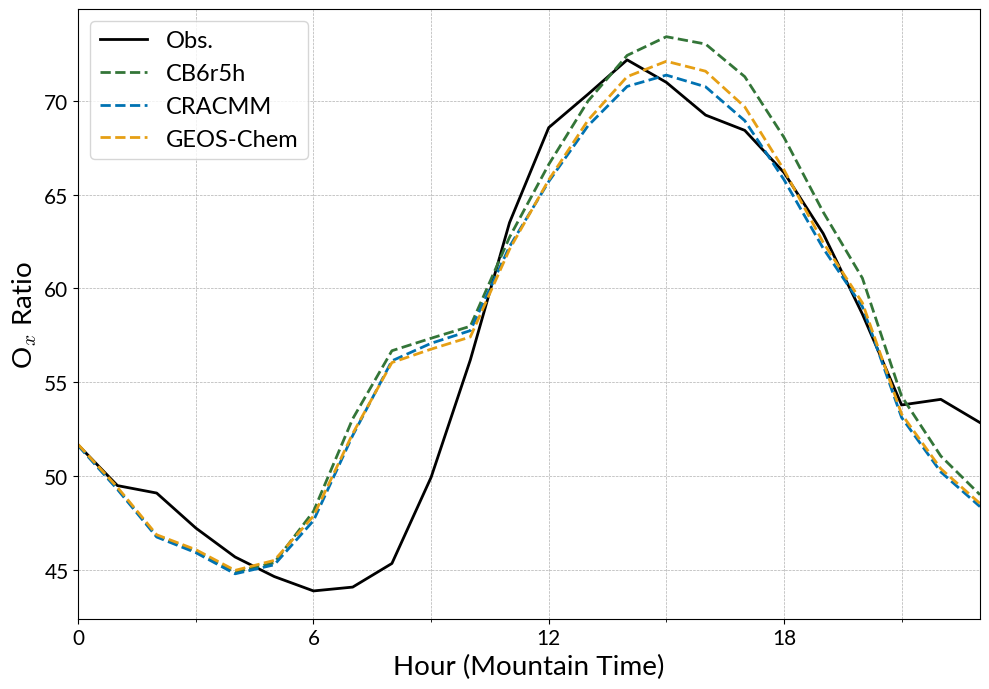

In [54]:
new_start_time = pd.Timestamp('2024-07-19 00:00:00')
new_end_time = pd.Timestamp('2024-08-12 23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_index = pd.date_range(start=new_start_time, end=new_end_time, freq='15min', tz = 'America/Denver')

df_CB6r5h_hrly_species_conc = df_CB6r5h_species_conc.copy()
df_CRACMM_hrly_species_conc = df_CRACMM_species_conc.copy()
df_GEOSChem_hrly_species_conc = df_GEOSChem_species_conc.copy()
# df_MCM_hrly_species_conc = df_MCM_species_conc.copy()

df_CB6r5h_hrly_species_conc.set_index(new_index, inplace=True)
df_CRACMM_hrly_species_conc.set_index(new_index, inplace=True)
df_GEOSChem_hrly_species_conc.set_index(new_index, inplace=True)
# df_MCM_hrly_species_conc.set_index(new_index, inplace=True)

hour_range = np.arange(0,24,1)

#Put data into hour-of-day bin
df_CB6r5h_hrly_species_conc['hour'] = df_CB6r5h_hrly_species_conc.index.hour
df_CRACMM_hrly_species_conc['hour'] = df_CRACMM_hrly_species_conc.index.hour
df_GEOSChem_hrly_species_conc['hour'] = df_GEOSChem_hrly_species_conc.index.hour
#df_MCM_hrly_species_conc['hour'] = df_MCM_hrly_species_conc.index.hour

#Group by hour and take mean per species
df_CB6r5h_hourly_means_species_conc = df_CB6r5h_hrly_species_conc.groupby('hour').mean()
df_CRACMM_hourly_means_species_conc = df_CRACMM_hrly_species_conc.groupby('hour').mean()
df_GEOSChem_hourly_means_species_conc = df_GEOSChem_hrly_species_conc.groupby('hour').mean()

fig, ax = plt.subplots(figsize = (10,7), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(hour_range, df_CB6r5h_hourly_means_species_conc['O3Initconc']+df_CB6r5h_hourly_means_species_conc['NO2Initconc']+ 2*df_CB6r5h_hourly_means_species_conc['NO3Initconc']+3*df_CB6r5h_hourly_means_species_conc['N2O5Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(hour_range, df_CB6r5h_hourly_means_species_conc['O3conc']+df_CB6r5h_hourly_means_species_conc['NO2conc']+ 2*df_CB6r5h_hourly_means_species_conc['NO3conc']+3*df_CB6r5h_hourly_means_species_conc['N2O5conc'], label = 'CB6r5h', linestyle = 'dashed', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(hour_range, df_CRACMM_hourly_means_species_conc['O3conc']+df_CRACMM_hourly_means_species_conc['NO2conc']+ 2*df_CRACMM_hourly_means_species_conc['NO3conc']+3*df_CRACMM_hourly_means_species_conc['N2O5conc'], label = 'CRACMM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(hour_range, df_GEOSChem_hourly_means_species_conc['O3conc']+df_GEOSChem_hourly_means_species_conc['NO2conc']+2*df_GEOSChem_hourly_means_species_conc['NO3conc']+3*df_GEOSChem_hourly_means_species_conc['N2O5conc'], label = 'GEOS-Chem', linestyle = 'dashed', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index, df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'dashed', linewidth = 2, color = four_colorset1[3].tolist())

#ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
ax.xaxis.set_minor_locator(MultipleLocator(3))
ax.xaxis.set_major_locator(MultipleLocator(6))
plt.xlabel('Hour (Mountain Time)')
plt.xticks(np.arange(0,24,6))
ax.grid(which='both', linestyle='--', linewidth=0.5)
plt.margins(x=0)

plt.ylabel('O$_x$ Ratio')
plt.legend(loc='upper left')
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ox_mechanism_avg_hourly_comparison_07192024_08122024.png', dpi =150)
plt.show()

---

In [10]:
import yaml
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import MultipleLocator
#import cmasher as cmr
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
import re

import IPython
notebook_name = "/".join(
        IPython.extract_module_locals()[1]["__vsc_ipynb_file__"].split("/")[-5:]
    )

#Plot formatting
mpl.rcParams['xtick.labelsize'] = 15
mpl.rcParams['ytick.labelsize'] = 15
mpl.rcParams['legend.fontsize'] = 16
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['axes.titlesize'] = 28
mpl.rcParams['axes.xmargin'] = 0

# Set the font family to 'serif'
mpl.rcParams['font.family'] = 'serif'
# Specify preferred serif font (Computer Modern Roman is 'cmr10')
mpl.rcParams['font.serif'] = 'Lato' 
# Optionally, configure mathtext to use Computer Modern fonts as well
mpl.rcParams['mathtext.fontset'] = 'cm'
# Ensure minus signs are rendered correctly with CM fonts
mpl.rcParams['axes.unicode_minus'] = False

In [11]:
#Colorblind friendly colors in RGB:
forest_green_color = np.array([51,117,56])
bright_green_color = np.array([51, 117, 56])
indigo_color = np.array([46, 37, 133])
bright_blue_color = np.array([0, 114, 178])
light_blue_color = np.array([86, 180, 233])
pale_blue_color = np.array([148, 203, 236])
yellow_orange_color = np.array([230, 159, 0])
sunny_yellow_color = np.array([230, 159, 20])
lemon_yellow_color = np.array([240, 228, 66])
bright_orange_color = np.array([93, 168, 153])
desaturated_pink_color = np.array([194, 106, 119])
saturated_orchid_color = np.array([194, 106, 119])
purple_orchid_color = np.array([159, 74, 150])


def rgb_range_correction(color_names):
    mpl_formatted_colors = []
    for c in range(0,len(color_names)):
        rgb_division = color_names[c]/255
        mpl_formatted_colors.append(rgb_division)
    return mpl_formatted_colors

four_colorset1 = rgb_range_correction([forest_green_color, light_blue_color, sunny_yellow_color, desaturated_pink_color])

In [12]:
import os
run_number = '1'
mech_name = ['CB6r5h', 'CRACMM', 'GEOS-Chem']#, 'MCM']
start_date = date(2024, 7, 19)
end_date   = date(2024, 8, 12)

# df_MCM_species_conc = pd.DataFrame()

df_CB6r5h_analysis = pd.DataFrame()
df_CRACMM_analysis = pd.DataFrame()
df_GEOSChem_analysis = pd.DataFrame()
df_CB6r5h_species_conc = pd.DataFrame()
df_CRACMM_species_conc = pd.DataFrame()
df_GEOSChem_species_conc = pd.DataFrame()
df_MCM_species_conc = pd.DataFrame()

all_runs = {mech: {} for mech in mech_name}
RO2_labels = {}

date_count = start_date
while date_count <= end_date:
    run_month = date_count.month
    run_day = date_count.day
    run_date_str = f"{run_month}_{run_day}_2024"

    for mech in mech_name:
        yaml_usos_dirpath = os.path.join(dirpath, f'F0AM-4.4.2/Runs/USOS_{run_date_str}')
        yaml_usos_full_filepath_analysis = os.path.join(
            yaml_usos_dirpath, 
            f'Run{run_number}/{mech}/USOS_{run_date_str}_{mech}_Run{run_number}_analysis_output.yaml'
        )
        
        print('Now loading file:', yaml_usos_full_filepath_analysis)
        
        with open(yaml_usos_full_filepath_analysis, 'r') as f:
            yaml_usos_analysis = yaml.full_load(f)
        
        # Store in the dictionary keyed by mech and run date
        all_runs[mech][run_date_str] = yaml_usos_analysis

        # Grab RO2_NO_conversion_rxns once per mechanism
        if mech not in RO2_labels:
            RO2_labels[mech] = []
            for rxn in yaml_usos_analysis['RO2_NO_conversion_rxns']:
                reactants = rxn.split('=')[0]
                if "+ NO" in reactants:
                    species = reactants.split('+ NO')[0]
                elif "+NO" in reactants:
                    species = reactants.split("+NO")[0]
                elif 'NO +' in reactants:
                    species = reactants.split('NO + ')[1]
                else:
                    print('Split invalid:', rxn)
                    continue
                RO2_labels[mech].append(species.strip())

    date_count += timedelta(days=1)


Now loading file: /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_19_2024/Run1/CB6r5h/USOS_7_19_2024_CB6r5h_Run1_analysis_output.yaml
Now loading file: /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_19_2024/Run1/CRACMM/USOS_7_19_2024_CRACMM_Run1_analysis_output.yaml
Now loading file: /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_19_2024/Run1/GEOS-Chem/USOS_7_19_2024_GEOS-Chem_Run1_analysis_output.yaml
Now loading file: /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_20_2024/Run1/CB6r5h/USOS_7_20_2024_CB6r5h_Run1_analysis_output.yaml
Now loading file: /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_7_20_2024/Run1/CRACMM/USOS_7_20_2024_CRACMM_Run1_analysis_output.yaml
Now loading file: /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/

In [13]:
mech = 'CB6r5h'
runs_arr = np.stack([v['RO2_NO_scaled_rates'] for v in all_runs[mech].values()], axis=0)

# Sum over species
sum_total = np.sum(runs_arr, axis=1)

# Fractional contribution
frac_contribution = runs_arr / sum_total[:, None, :] * 100

# Average over all days
frac_mean = np.mean(frac_contribution, axis=0)
print(np.shape(frac_mean))

# Access the RO2 labels
species_labels = RO2_labels[mech]

print(species_labels)

day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))



(10, 96)
['C2O3', 'CXO3', 'MEO2', 'HCO3', 'ISO2', 'EPX2', 'BZO2', 'TO2', 'XLO2', 'OPO3']
96


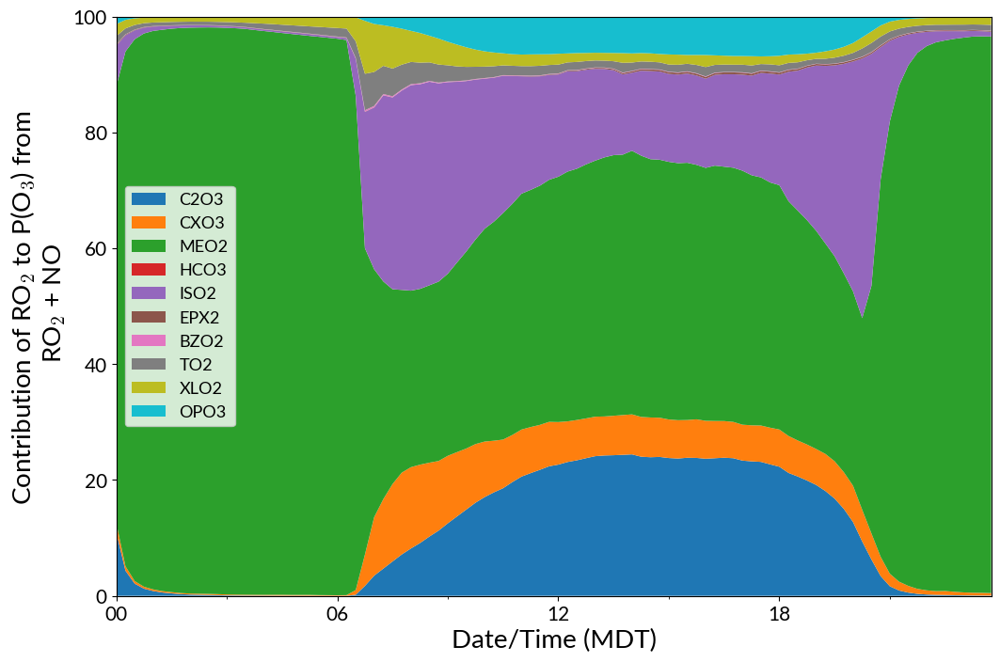

In [93]:
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, frac_mean[:,:], labels = species_labels)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

In [32]:
mech_category_files = {
    'CB6r5h': '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/Mechanism_info/species_grouping/ro2_cb6r5h_mapping.csv',
    'CRACMM': '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/Mechanism_info/species_grouping/ro2_cracmm_mapping.csv',
    'GEOS-Chem': '/uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/Mechanism_info/species_grouping/ro2_geoschem_mapping.csv'
}

mech_to_label_to_cat = {}

for mech, file in mech_category_files.items():
    df = pd.read_csv(file, encoding='utf-8')
    # Strip any spaces or hidden characters from column names
    df.columns = df.columns.str.strip()
    
    print(df.head())
    print(df.columns.tolist())  # make sure 'Label' and 'Category' appear exactly

    mech_to_label_to_cat[mech] = dict(zip(df['Label'], df['Category']))

  Label               Category
0  C2O3   Peroxyacetyl radical
1  CXO3   Acyl peroxy radicals
2  MEO2  Methylperoxy radicals
3  HCO3           Formaldehyde
4  ISO2               Isoprene
['Label', 'Category']
  Label               Category
0  ISOP               Isoprene
1   MO2  Methylperoxy radicals
2  ETHP       Alkanes - Ethane
3  HC3P                Alkanes
4  HC5P                Alkanes
['Label', 'Category']
    Label              Category
0    A3O2     Alkanes - Propane
1    ACO3  Peroxyacetyl radical
2   ACRO2             Aldehydes
3  ALK4N1       Alkanes - C4/C5
4  ALK4O2         Alkanes C4/C5
['Label', 'Category']


In [ ]:

# -------------------------------
# Get all unique categories
# -------------------------------
all_categories = set()
for mech_map in mech_to_label_to_cat.values():
    all_categories.update(mech_map.values())
all_categories = sorted(all_categories)
print("All categories:", all_categories)

# -------------------------------
# Base colors for categories
# -------------------------------
import matplotlib.colors as mcolors

base_colors = {
    'Acetic Acid':'royalblue',
    'Acetone':'darkred',
    'Acyl peroxy radicals': 'tan',
    'Aldehydes':'thistle',
    'Alkanes': 'pink',
    'Alkanes - Alkyl nitrates':'',
    'Alkanes - C2/no Ethane'

    'Formaldehyde':'mediumslateblue',
    
    'Aromatic aldehydes':'orchid',
    'Aromatics': 'purple',
    'Aromatic ring-opening product':'chocolate',
    
    
    'C4/C5 Alkanes':'palevioletred',
    'Ethane (Alkanes)':'hotpink',
    'Propane (Alkanes)':'mediumvioletred',

    'Isoprene': 'green',
    'Terpenes': 'lightgreen',

    'Methylperoxy radicals': 'peachpuff',
    'Peroxyacetyl radical': 'salmon',
    
    'Peroxypropionyl radical':'orange',

    
    'Ketones': 'red',
    'Dienes':'teal',
    'Mix of Isoprene, Monoterpenes, Alkanes':'sienna',
    
    'Terminal alkenes':'dodgerblue',
    'Internal olefins/alkenes':'turquoise',
    'Ethene (Alkenes)':'cyan'
}

def get_color(label, category):
    """
    Assigns color based on label or category:
    - Any label containing 'Alkanes' -> pink
    - Any label containing 'Alkenes' -> red
    - Any label containing 'Aromatic' -> blue
    - Otherwise, use category base color
    """
    return base_colors.get(category, 'slategrey')


All categories: ['Acetic Acid', 'Acetone', 'Acyl peroxy radicals', 'Aldehydes', 'Alkanes', 'Alkyl nitrates (Alkanes)', 'Aromatic aldehydes', 'Aromatic ring-opening product', 'Aromatics', 'C2 Alkanes (excluding Ethane)', 'C4-C5 Alkanes', 'C6 Alkanes', 'C7 Alkanes', 'Dienes', 'Ethane (Alkanes)', 'Ethene (Alkenes)', 'Formaldehyde', 'Internal olefins-alkenes', 'Isoprene', 'Ketones', 'Methylperoxy radicals', 'Mix of Isoprene-Monoterpenes-Alkanes', 'Other-unknown', 'Peroxyacetyl radical', 'Peroxypropionyl radical', 'Propane (Alkanes)', 'Propene (Alkenes)', 'Terminal alkenes', 'Terpenes']


In [25]:
mech = 'CB6r5h'
runs_arr = np.stack([v['RO2_NO_scaled_rates'] for v in all_runs[mech].values()], axis=0)

# Sum over species
sum_total = np.sum(runs_arr, axis=1)

# Fractional contribution
frac_contribution = runs_arr / sum_total[:, None, :] * 100

# Average over all days
frac_mean = np.mean(frac_contribution, axis=0)
print(np.shape(frac_mean))

# Access the RO2 labels
species_labels = RO2_labels[mech]

print(species_labels)

day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))

species_categories = [mech_to_label_to_cat[mech].get(s, 'Other') for s in species_labels]

# 2. Get colors
colors = [get_color(s, c) for s, c in zip(species_labels, species_categories)]

# 3. Reorder by category (group same-color species together)
sorted_indices = sorted(range(len(species_labels)),
                        key=lambda i: species_categories[i])  # sort by category
species_labels_sorted = [species_labels[i] for i in sorted_indices]
species_categories_sorted = [species_categories[i] for i in sorted_indices]
colors_sorted = [colors[i] for i in sorted_indices]

frac_mean_sorted = frac_mean[sorted_indices,:]  # reorder columns in data
print(frac_mean_sorted)
print(frac_mean_sorted.shape)

(10, 96)
['C2O3', 'CXO3', 'MEO2', 'HCO3', 'ISO2', 'EPX2', 'BZO2', 'TO2', 'XLO2', 'OPO3']
96
[[1.62925187e+00 7.64307228e-01 4.50455098e-01 3.31706707e-01
  2.78258780e-01 2.36485012e-01 2.14374860e-01 1.88266467e-01
  1.77553293e-01 1.76982286e-01 1.82139074e-01 1.74571219e-01
  1.55295867e-01 1.42568896e-01 1.37089385e-01 1.36788319e-01
  1.36451173e-01 1.45889251e-01 1.53489170e-01 1.37436966e-01
  1.42407853e-01 1.46637448e-01 1.17509865e-01 1.06170525e-01
  9.48033954e-02 1.10217275e-01 8.03693128e-01 5.41456130e+00
  1.00980270e+01 1.19993507e+01 1.33734750e+01 1.41277337e+01
  1.40324580e+01 1.35177136e+01 1.27516399e+01 1.20209334e+01
  1.16592423e+01 1.10971813e+01 1.05416917e+01 1.01286633e+01
  9.58862942e+00 8.91559947e+00 8.39885348e+00 8.13247361e+00
  8.11747900e+00 7.95273763e+00 7.75633037e+00 7.67171766e+00
  7.34419574e+00 7.01316303e+00 6.95698814e+00 6.86861114e+00
  6.81495741e+00 6.73742113e+00 6.81056824e+00 6.86638229e+00
  6.90661481e+00 6.86828032e+00 6.860248

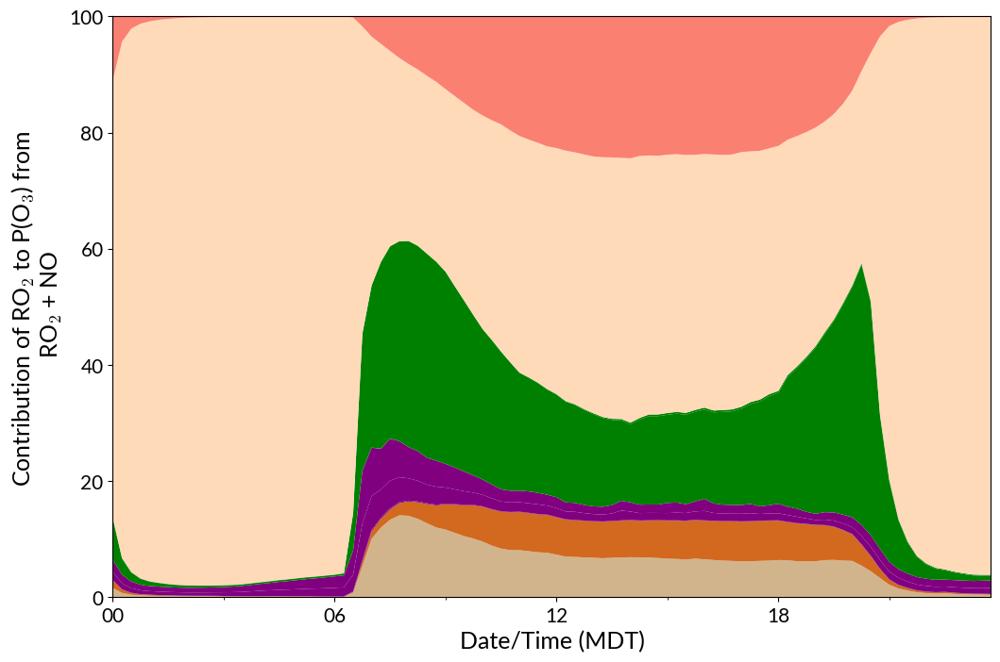

In [27]:
# 4. Plot
fig, ax = plt.subplots(figsize=(12,8))
ax.stackplot(new_day_index, frac_mean_sorted, labels=species_categories_sorted, colors=colors_sorted)

# X-axis formatting
import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0,6,12,18]))
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0,3,6,9,12,15,18,21]))

plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.margins(y=0)
# Legend for categories only
from matplotlib.patches import Patch
unique_cats = sorted(set(species_categories_sorted))
cat_colors = {cat: get_color(cat, cat) for cat in unique_cats}  # map category -> color
handles = [Patch(color=cat_colors[cat], label=cat) for cat in unique_cats]
#plt.legend(handles=handles)

plt.show()

In [28]:
mech = 'CRACMM'
runs_arr = np.stack([v['RO2_NO_scaled_rates'] for v in all_runs[mech].values()], axis=0)

# Sum over species
sum_total = np.sum(runs_arr, axis=1)

# Fractional contribution
frac_contribution = runs_arr / sum_total[:, None, :] * 100

# Average over all days
frac_mean = np.mean(frac_contribution, axis=0)
print(np.shape(frac_mean))

# Access the RO2 labels
species_labels = RO2_labels[mech]

print(species_labels)

day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))

species_categories = [mech_to_label_to_cat[mech].get(s, 'Other') for s in species_labels]

# 2. Get colors
colors = [get_color(s, c) for s, c in zip(species_labels, species_categories)]

# 3. Reorder by category (group same-color species together)
sorted_indices = sorted(range(len(species_labels)),
                        key=lambda i: species_categories[i])  # sort by category
species_labels_sorted = [species_labels[i] for i in sorted_indices]
species_categories_sorted = [species_categories[i] for i in sorted_indices]
colors_sorted = [colors[i] for i in sorted_indices]

frac_mean_sorted = frac_mean[sorted_indices,:]  # reorder columns in data
print(frac_mean_sorted)
print(frac_mean_sorted.shape)

(55, 96)
['ISOP', 'MO2', 'ETHP', 'HC3P', 'HC5P', 'ETEP', 'OLTP', 'OLIP', 'BENP', 'TOLP', 'XYLP', 'EBZP', 'APIP1', 'APIP2', 'APINP1', 'APINP2', 'LIMP1', 'LIMP2', 'LIMNP1', 'LIMNP2', 'ACO3', 'RCO3', 'ACTP', 'KETP', 'MACP', 'MCP', 'MVKP', 'UALP', 'BALP', 'BAL1', 'ORAP', 'OLNN', 'OLND', 'BDE13P', 'FURANO2', 'SESQNRO2', 'SESQRO2', 'VROCP6ALKP', 'VROCP5ALKP', 'VROCP4ALKP', 'VROCP3ALKP', 'VROCP2ALKP', 'VROCP1ALKP', 'HC10P', 'VROCP6ALKP2', 'VROCP5ALKP2', 'VROCP4ALKP2', 'VROCP3ALKP2', 'VROCP2ALKP2', 'VROCP1ALKP2', 'HC10P2', 'VROCP6AROP', 'VROCP5AROP', 'NAPHP', 'STYP']
96
[[1.10503203e-03 9.61788184e-04 8.78733370e-04 ... 6.84642842e-04
  6.58125254e-04 6.41420492e-04]
 [7.26105312e-03 6.33600652e-03 5.83388107e-03 ... 1.85002982e-04
  1.77440075e-04 1.72663936e-04]
 [2.33957945e-01 1.43245188e-01 1.09671419e-01 ... 7.14984969e-02
  7.22286757e-02 6.72784784e-02]
 ...
 [4.89634788e-02 3.36757368e-02 3.39762715e-02 ... 2.27480032e-02
  1.94866122e-02 2.01834678e-02]
 [0.00000000e+00 0.00000000e+0

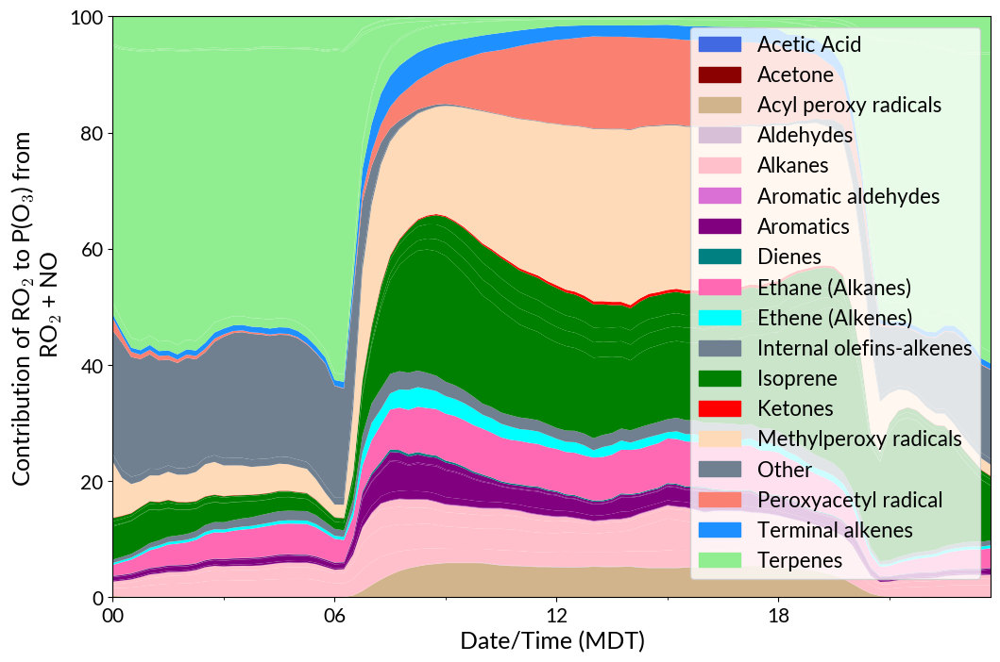

In [31]:
# 4. Plot
fig, ax = plt.subplots(figsize=(12,8))
ax.stackplot(new_day_index, frac_mean_sorted, labels=species_categories_sorted, colors=colors_sorted)

# X-axis formatting
import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0,6,12,18]))
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0,3,6,9,12,15,18,21]))

plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.margins(y=0)
# Legend for categories only
from matplotlib.patches import Patch
unique_cats = sorted(set(species_categories_sorted))
cat_colors = {cat: get_color(cat, cat) for cat in unique_cats}  # map category -> color
handles = [Patch(color=cat_colors[cat], label=cat) for cat in unique_cats]
plt.legend(handles=handles)

plt.show()

(55, 96)
['ISOP', 'MO2', 'ETHP', 'HC3P', 'HC5P', 'ETEP', 'OLTP', 'OLIP', 'BENP', 'TOLP', 'XYLP', 'EBZP', 'APIP1', 'APIP2', 'APINP1', 'APINP2', 'LIMP1', 'LIMP2', 'LIMNP1', 'LIMNP2', 'ACO3', 'RCO3', 'ACTP', 'KETP', 'MACP', 'MCP', 'MVKP', 'UALP', 'BALP', 'BAL1', 'ORAP', 'OLNN', 'OLND', 'BDE13P', 'FURANO2', 'SESQNRO2', 'SESQRO2', 'VROCP6ALKP', 'VROCP5ALKP', 'VROCP4ALKP', 'VROCP3ALKP', 'VROCP2ALKP', 'VROCP1ALKP', 'HC10P', 'VROCP6ALKP2', 'VROCP5ALKP2', 'VROCP4ALKP2', 'VROCP3ALKP2', 'VROCP2ALKP2', 'VROCP1ALKP2', 'HC10P2', 'VROCP6AROP', 'VROCP5AROP', 'NAPHP', 'STYP']
96
All categories: ['Acetic Acid', 'Acetone', 'Acyl peroxy radicals', 'Aldehydes', 'Alkanes', 'Alkyl nitrates (Alkanes)', 'Aromatic aldehydes', 'Aromatic ring-opening product', 'Aromatics', 'C2 Alkanes (excluding Ethane)', 'C4-C5 Alkanes', 'C6 Alkanes', 'C7 Alkanes', 'Dienes', 'Ethane (Alkanes)', 'Ethene (Alkenes)', 'Formaldehyde', 'Internal olefins-alkenes', 'Isoprene', 'Ketones', 'Methylperoxy radicals', 'Mix of Isoprene-Monoter

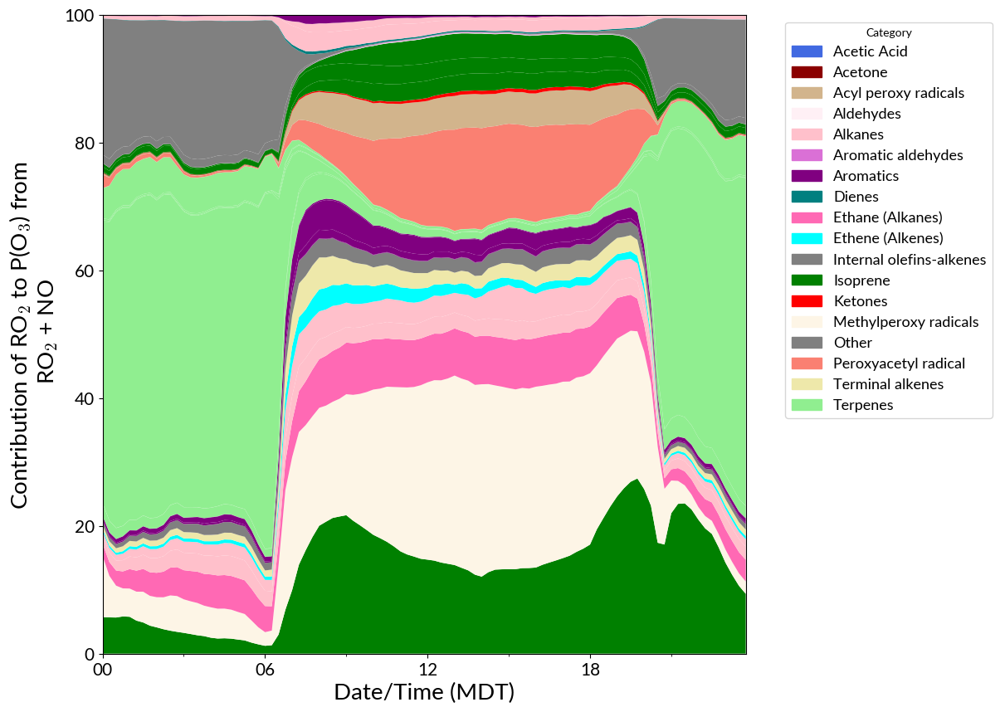

In [201]:
mech = 'CRACMM'
runs_arr = np.stack([v['RO2_NO_scaled_rates'] for v in all_runs[mech].values()], axis=0)

# Sum over species
sum_total = np.sum(runs_arr, axis=1)

# Fractional contribution
frac_contribution = runs_arr / sum_total[:, None, :] * 100

# Average over all days
frac_mean = np.mean(frac_contribution, axis=0)
print(np.shape(frac_mean))

# Access the RO2 labels
species_labels = RO2_labels[mech]

print(species_labels)

day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))
# -------------------------------
# Get all unique categories
# -------------------------------
all_categories = set()
for mech_map in mech_to_label_to_cat.values():
    all_categories.update(mech_map.values())
all_categories = sorted(all_categories)
print("All categories:", all_categories)

# -------------------------------
# Base colors for categories
# -------------------------------
import matplotlib.colors as mcolors

base_colors = {
    'Aldehydes':'lavenderblush',
    'Aromatic aldehydes':'orchid',
    'Aromatics': 'purple',
    'Acetic Acid':'royalblue',
    'Isoprene': 'green',
    'Terpenes': 'lightgreen',
    'Alkanes': 'pink',
    'C4/C5 Alkanes':'magenta',
    'Ethane (Alkanes)':'hotpink',
    'Propane (Alkanes)':'plum',
    'Methylperoxy radicals': 'oldlace',
    'Peroxyacetyl radical': 'salmon',
    'Acyl peroxy radicals': 'tan',
    'Acetone':'darkred',
    'Ketones': 'red',
    'Formaldehyde':'darkorange',
    'Peroxypropionyl radical':'khaki',
    'Dienes':'teal',
    'Mix of Isoprene, Monoterpenes, Alkanes':'mintcream',
    'Aromatic ring-opening product':'chocolate',
    'Terminal alkenes':'palegoldenrod',
    'Internal olefins/alkenes':'lemonchiffon',
    'Ethene (Alkenes)':'cyan'
}

def get_color(label, category):
    """
    Assigns color based on label or category:
    - Any label containing 'Alkanes' -> pink
    - Any label containing 'Alkenes' -> red
    - Any label containing 'Aromatic' -> blue
    - Otherwise, use category base color
    """
    # if 'Alkanes' in label:
    #     return 'pink'
    # elif 'Alkenes' in label:
    #     return 'red'
    # elif 'Aromatic' in label:
    #     return 'blue'
    # elif re.search(r'Alkanes', label, re.IGNORECASE):  # regex search, case-insensitive
    #     return 'pink'
    return base_colors.get(category, 'gray')

# -------------------------------
# Example: CB6r5h plot
# -------------------------------
mech = 'CRACMM'
species_labels = RO2_labels[mech]               # list of species for CB6r5h
species_categories = [mech_to_label_to_cat[mech].get(sp, 'Other') for sp in species_labels]
colors = [get_color(sp, cat) for sp, cat in zip(species_labels, species_categories)]

# Dummy data for demonstration (replace with your actual)
# frac_mean.shape = (time x species)
# new_day_index = pandas datetime index
# Example: frac_mean = np.random.rand(96, len(species_labels))
#          new_day_index = pd.date_range("2024-07-19", periods=96, freq='15min')

fig, ax = plt.subplots(figsize=(10,10))
ax.stackplot(new_day_index, frac_mean, labels=species_labels, colors=colors)

# X-axis formatting
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0,6,12,18]))
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0,3,6,9,12,15,18,21]))

plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.margins(y=0)

# Make legend show only unique categories
unique_cats = sorted(set(species_categories))
cat_colors = {cat: get_color('', cat) for cat in unique_cats}  # color per category
handles = [Patch(color=cat_colors[cat], label=cat) for cat in unique_cats]
plt.legend(handles=handles, title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/cracmm_ro2_comparison.png', dpi =150)
plt.show()

(69, 96)
['MO2', 'MCO3', 'ETO2', 'OTHRO2', 'A3O2', 'PO2', 'R7O2', 'R7N1', 'BUTO2', 'ACRO2', 'ACO3', 'ALK4O2', 'ALK4N1', 'R4O2', 'R4N1', 'ATO2', 'KO2', 'B3O2', 'PRN1', 'RCO3', 'KO2', 'MEKCO3', 'GCO3', 'APINO2', 'PINO3', 'C96O2', 'BPINO2', 'BPINOO2', 'LIMO2', 'LIMKO2', 'LIMO3', 'PIO2', 'OLNN', 'OLND', 'IHOO1', 'IHOO1', 'IHOO4', 'IHOO4', 'IHPOO1', 'IHPOO2', 'IHPOO3', 'IEPOXAOO', 'IEPOXBOO', 'ICHOO', 'HPALD1OO', 'HPALD2OO', 'ISOPNOO1', 'ISOPNOO2', 'IDHNDOO1', 'IDHNDOO2', 'IDHNBOO', 'INO2B', 'INO2D', 'IHPNBOO', 'IHPNDOO', 'IDNOO', 'C4HVP1', 'C4HVP2', 'MVKOHOO', 'MCROHOO', 'MACR1OO', 'MACRNO2', 'ZRO2', 'ETOO', 'AROMRO2', 'TLFUO2', 'AROMCO3', 'BZCO3', 'BENZO2']
96
All categories: ['Acetic Acid', 'Acetone', 'Acyl peroxy radicals', 'Aldehydes', 'Alkanes', 'Alkyl nitrates (Alkanes)', 'Aromatic aldehydes', 'Aromatic ring-opening product', 'Aromatics', 'C2 Alkanes (excluding Ethane)', 'C4-C5 Alkanes', 'C6 Alkanes', 'C7 Alkanes', 'Dienes', 'Ethane (Alkanes)', 'Ethene (Alkenes)', 'Formaldehyde', 'In

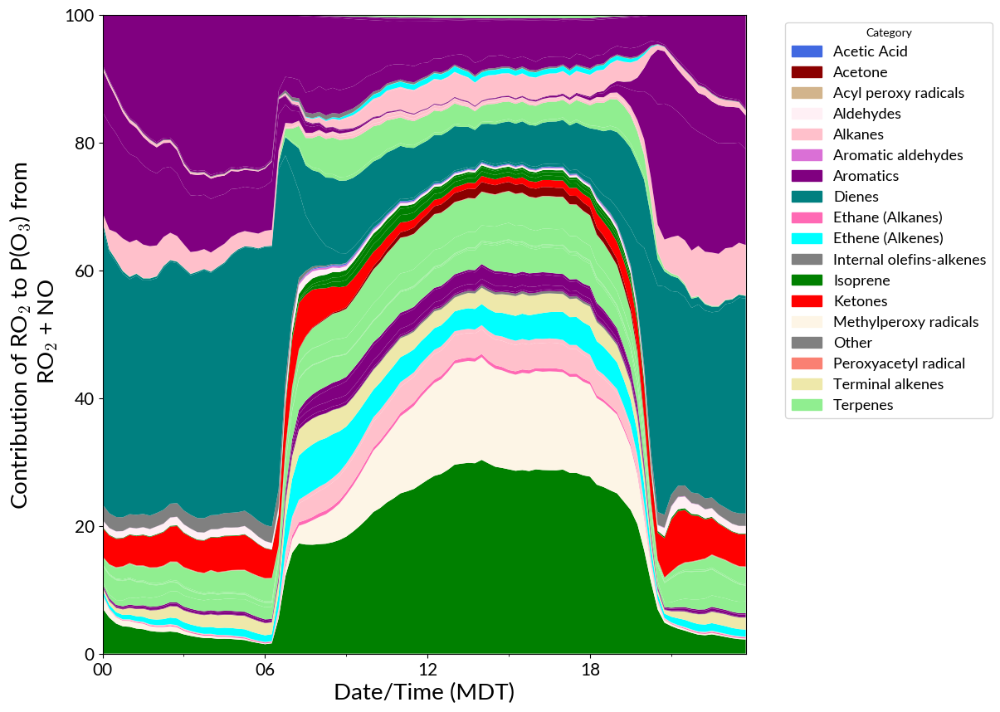

In [202]:
mech = 'GEOS-Chem'
runs_arr = np.stack([v['RO2_NO_scaled_rates'] for v in all_runs[mech].values()], axis=0)

# Sum over species
sum_total = np.sum(runs_arr, axis=1)

# Fractional contribution
frac_contribution = runs_arr / sum_total[:, None, :] * 100

# Average over all days
frac_mean = np.mean(frac_contribution, axis=0)
print(np.shape(frac_mean))

# Access the RO2 labels
species_labels = RO2_labels[mech]

print(species_labels)

day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))
# -------------------------------
# Get all unique categories
# -------------------------------
all_categories = set()
for mech_map in mech_to_label_to_cat.values():
    all_categories.update(mech_map.values())
all_categories = sorted(all_categories)
print("All categories:", all_categories)

# -------------------------------
# Base colors for categories
# -------------------------------
import matplotlib.colors as mcolors

base_colors = {
    'Aldehydes':'lavenderblush',
    'Aromatic aldehydes':'orchid',
    'Aromatics': 'purple',
    'Acetic Acid':'royalblue',
    'Isoprene': 'green',
    'Terpenes': 'lightgreen',
    'Alkanes': 'pink',
    'C4/C5 Alkanes':'magenta',
    'Ethane (Alkanes)':'hotpink',
    'Propane (Alkanes)':'plum',
    'Methylperoxy radicals': 'oldlace',
    'Peroxyacetyl radical': 'salmon',
    'Acyl peroxy radicals': 'tan',
    'Acetone':'darkred',
    'Ketones': 'red',
    'Formaldehyde':'darkorange',
    'Peroxypropionyl radical':'khaki',
    'Dienes':'teal',
    'Mix of Isoprene, Monoterpenes, Alkanes':'mintcream',
    'Aromatic ring-opening product':'chocolate',
    'Terminal alkenes':'palegoldenrod',
    'Internal olefins/alkenes':'lemonchiffon',
    'Ethene (Alkenes)':'cyan'
}

def get_color(label, category):
    """
    Assigns color based on label or category:
    - Any label containing 'Alkanes' -> pink
    - Any label containing 'Alkenes' -> red
    - Any label containing 'Aromatic' -> blue
    - Otherwise, use category base color
    """
    # if 'Alkanes' in label:
    #     return 'pink'
    # elif 'Alkenes' in label:
    #     return 'red'
    # elif 'Aromatic' in label:
    #     return 'blue'
    # elif re.search(r'Alkanes', label, re.IGNORECASE):  # regex search, case-insensitive
    #     return 'pink'
    return base_colors.get(category, 'gray')

# -------------------------------
# Example: CB6r5h plot
# -------------------------------
mech = 'CRACMM'
species_labels = RO2_labels[mech]               # list of species for CB6r5h
species_categories = [mech_to_label_to_cat[mech].get(sp, 'Other') for sp in species_labels]
colors = [get_color(sp, cat) for sp, cat in zip(species_labels, species_categories)]

# Dummy data for demonstration (replace with your actual)
# frac_mean.shape = (time x species)
# new_day_index = pandas datetime index
# Example: frac_mean = np.random.rand(96, len(species_labels))
#          new_day_index = pd.date_range("2024-07-19", periods=96, freq='15min')

fig, ax = plt.subplots(figsize=(10,10))
ax.stackplot(new_day_index, frac_mean, labels=species_labels, colors=colors)

# X-axis formatting
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0,6,12,18]))
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0,3,6,9,12,15,18,21]))

plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.margins(y=0)

# Make legend show only unique categories
unique_cats = sorted(set(species_categories))
cat_colors = {cat: get_color('', cat) for cat in unique_cats}  # color per category
handles = [Patch(color=cat_colors[cat], label=cat) for cat in unique_cats]
plt.legend(handles=handles, title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/geoschem_ro2_comparison.png', dpi =150)
plt.show()

In [ ]:
mech = 'GEOS-Chem'
runs_arr = np.stack([v['RO2_NO_scaled_rates'] for v in all_runs[mech].values()], axis=0)

# Sum over species
sum_total = np.sum(runs_arr, axis=1)

# Fractional contribution
frac_contribution = runs_arr / sum_total[:, None, :] * 100

# Average over all days
frac_mean = np.mean(frac_contribution, axis=0)
print(np.shape(frac_mean))

# Access the RO2 labels
species_labels = RO2_labels[mech]

print(species_labels)

day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))
# -------------------------------
# Get all unique categories
# -------------------------------
all_categories = set()
for mech_map in mech_to_label_to_cat.values():
    all_categories.update(mech_map.values())
all_categories = sorted(all_categories)
print("All categories:", all_categories)

# -------------------------------
# Base colors for categories
# -------------------------------
import matplotlib.colors as mcolors

base_colors = {
    'Aldehydes':'lavenderblush',
    'Aromatic aldehydes':'orchid',
    'Aromatics': 'purple',
    'Acetic Acid':'royalblue',
    'Isoprene': 'green',
    'Terpenes': 'lightgreen',
    'Alkanes': 'pink',
    'C4/C5 Alkanes':'magenta',
    'Ethane (Alkanes)':'hotpink',
    'Propane (Alkanes)':'plum',
    'Methylperoxy radicals': 'oldlace',
    'Peroxyacetyl radical': 'salmon',
    'Acyl peroxy radicals': 'tan',
    'Acetone':'darkred',
    'Ketones': 'red',
    'Formaldehyde':'darkorange',
    'Peroxypropionyl radical':'khaki',
    'Dienes':'teal',
    'Mix of Isoprene, Monoterpenes, Alkanes':'mintcream',
    'Aromatic ring-opening product':'chocolate',
    'Terminal alkenes':'palegoldenrod',
    'Internal olefins/alkenes':'lemonchiffon',
    'Ethene (Alkenes)':'cyan'
}

def get_color(label, category):
    """
    Assigns color based on label or category:
    - Any label containing 'Alkanes' -> pink
    - Any label containing 'Alkenes' -> red
    - Any label containing 'Aromatic' -> blue
    - Otherwise, use category base color
    """
    # if 'Alkanes' in label:
    #     return 'pink'
    # elif 'Alkenes' in label:
    #     return 'red'
    # elif 'Aromatic' in label:
    #     return 'blue'
    # elif re.search(r'Alkanes', label, re.IGNORECASE):  # regex search, case-insensitive
    #     return 'pink'
    return base_colors.get(category, 'gray')

# -------------------------------
# Example: CB6r5h plot
# -------------------------------
mech = 'CRACMM'
species_labels = RO2_labels[mech]               # list of species for CB6r5h
species_categories = [mech_to_label_to_cat[mech].get(sp, 'Other') for sp in species_labels]
colors = [get_color(sp, cat) for sp, cat in zip(species_labels, species_categories)]

# Dummy data for demonstration (replace with your actual)
# frac_mean.shape = (time x species)
# new_day_index = pandas datetime index
# Example: frac_mean = np.random.rand(96, len(species_labels))
#          new_day_index = pd.date_range("2024-07-19", periods=96, freq='15min')

fig, ax = plt.subplots(figsize=(12,8))
ax.stackplot(new_day_index, frac_mean, labels=species_labels, colors=colors)

# X-axis formatting
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0,6,12,18]))
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0,3,6,9,12,15,18,21]))

plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.margins(y=0)

# Make legend show only unique categories
unique_cats = sorted(set(species_categories))
cat_colors = {cat: get_color('', cat) for cat in unique_cats}  # color per category
handles = [Patch(color=cat_colors[cat], label=cat) for cat in unique_cats]
plt.legend(handles=handles, title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [153]:
all_categories = set()
for mech_map in mech_to_label_to_cat.values():
    all_categories.update(mech_map.values())
all_categories = sorted(all_categories)
print(all_categories)

['Acetic Acid', 'Acetone', 'Acyl peroxy radicals', 'Aldehydes', 'Alkanes', 'Alkyl nitrates (Alkanes)', 'Aromatic aldehydes', 'Aromatic ring-opening product', 'Aromatics', 'C2 Alkanes (excluding Ethane)', 'C4-C5 Alkanes', 'C6 Alkanes', 'C7 Alkanes', 'Dienes', 'Ethane (Alkanes)', 'Ethene (Alkenes)', 'Formaldehyde', 'Internal olefins-alkenes', 'Isoprene', 'Ketones', 'Methylperoxy radicals', 'Mix of Isoprene-Monoterpenes-Alkanes', 'Other-unknown', 'Peroxyacetyl radical', 'Peroxypropionyl radical', 'Propane (Alkanes)', 'Propene (Alkenes)', 'Terminal alkenes', 'Terpenes']


In [154]:
import matplotlib.colors as mcolors

base_colors = {
    'Aldehydes':'indigo',
    'Aromatic aldehydes':'orchid',
    'Acetic Acid':'royalblue',
    'Isoprene': 'green',
    'Terpenes': 'orange',
    'Aromatics': 'blue',
    'Alkanes': 'pink',  # all Alkanes* get a pink variant
    'Methylperoxy radical': 'black',
    'Peroxyacetyl radical': 'lavenderblush',
    'Acyl peroxy radicals': 'darkblue',
    'Acetone':'darkred',
    'Ketones': 'honeydew',
    'Formaldehyde':'darkorange',
    'Peroxypropionyl radical':'rebeccapurple',
    'Dienes':'teal',
    'Mix of Isoprene, Monoterpenes, Alkanes':'mintcream'
}


def get_color(label, category):
    """
    Assigns color based on label or category:
    - Any label containing 'Alkanes' -> pink
    - Otherwise, use category base color
    """
    if 'Alkanes' in label:
        return 'pink'
    elif 'Alkenes' in label:
        return 'red'
    elif 'Aromatic' in label:
        return 'blue'
    return base_colors.get(category, 'gray')

In [156]:

# Map each species to a color
species_colors = []
for sp in species_labels:
    cat = mech_to_label_to_cat(sp, 'Other')
    
    # If category contains 'Alkanes' anywhere, assign pink (you could vary shade)
    if 'Alkanes' in cat:
        species_colors.append('pink')
    else:
        # Use the base color or gray as default
        species_colors.append(category_base_colors.get(cat, 'gray'))

# -------------------------------
# Plot
# -------------------------------
fig, ax = plt.subplots(figsize=(12, 8))

ax.stackplot(new_day_index, frac_mean.T, labels=species_labels, colors=species_colors)

# X-axis formatting
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=range(0, 24, 3)))

plt.legend(title='RO2 Species', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

TypeError: 'dict' object is not callable

In [151]:
colors = [get_color(sp, mech_to_label_to_cat[mech].get(sp, 'Other')) 
          for sp in species_labels]

In [149]:
import colorsys
import numpy as np

category_counts = {}  # to vary saturation per category

cat_colors = {}
for cat in all_categories:
    base = get_base_color(cat)
    # Convert base color to HLS to adjust lightness
    rgb = mcolors.to_rgb(base)
    h, l, s = colorsys.rgb_to_hls(*rgb)
    # vary lightness slightly if multiple subcategories exist
    count = category_counts.get(base, 0)
    l_adj = np.clip(l * (0.85 + 0.1*count), 0, 1)  # vary ±10%
    category_counts[base] = count + 1
    cat_colors[cat] = colorsys.hls_to_rgb(h, l_adj, s)

In [150]:
# For a given mech:
species_categories = [mech_to_label_to_cat[mech].get(sp, 'Other') for sp in species_labels]
colors = [cat_colors[cat] for cat in species_categories]

In [144]:
mech = 'CB6r5h'
species_labels = RO2_labels[mech]
species_categories = [mech_to_label_to_cat[mech].get(sp, 'Other') for sp in species_labels]

In [145]:
# unique categories
unique_cats = list(dict.fromkeys(species_categories))  # preserves order
cmap = plt.get_cmap('tab20')  # choose colormap
cat_colors = {cat: cmap(i) for i, cat in enumerate(unique_cats)}

# assign a color to each species based on its category
colors = [cat_colors[cat] for cat in species_categories]

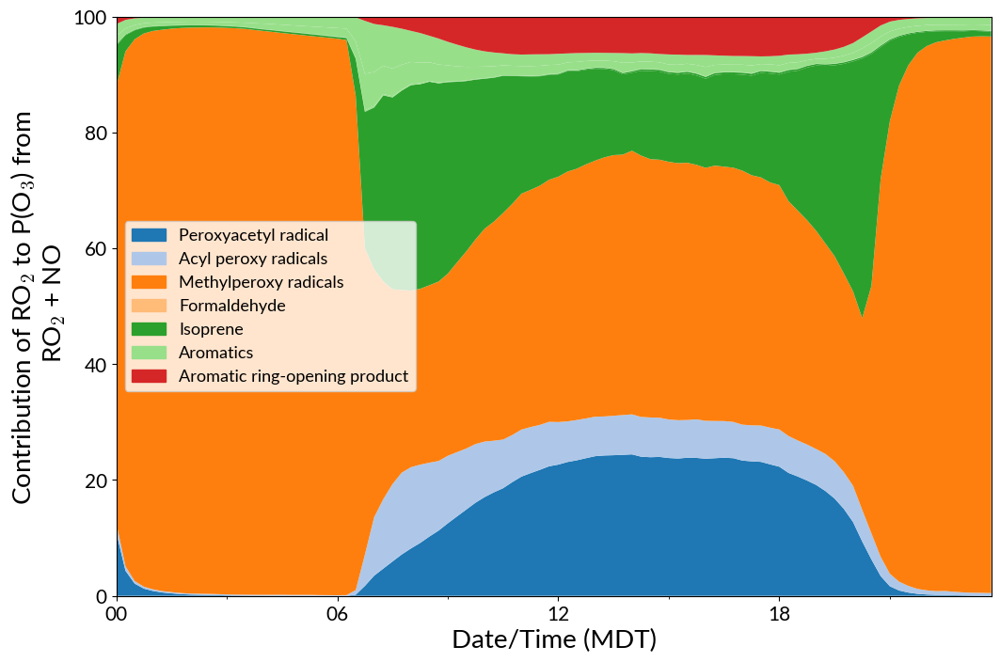

In [146]:
fig, ax = plt.subplots(figsize=(12,8))
ax.stackplot(new_day_index, frac_mean[:, :], labels=species_categories, colors=colors)

# Set x-axis formatting
import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0,6,12,18]))
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0,3,6,9,12,15,18,21]))

plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.margins(y=0)

# Make legend show only categories, not individual species
from matplotlib.patches import Patch
handles = [Patch(color=cat_colors[cat], label=cat) for cat in unique_cats]
plt.legend(handles=handles)

plt.show()

In [125]:
mech = 'CRACMM'
species_labels = RO2_labels[mech]
species_categories = [mech_to_label_to_cat[mech].get(sp, 'Other') for sp in species_labels]

In [126]:
# unique categories
unique_cats = list(dict.fromkeys(species_categories))  # preserves order
cmap = plt.get_cmap('tab20')  # choose colormap
cat_colors = {cat: cmap(i) for i, cat in enumerate(unique_cats)}

# assign a color to each species based on its category
colors = [cat_colors[cat] for cat in species_categories]

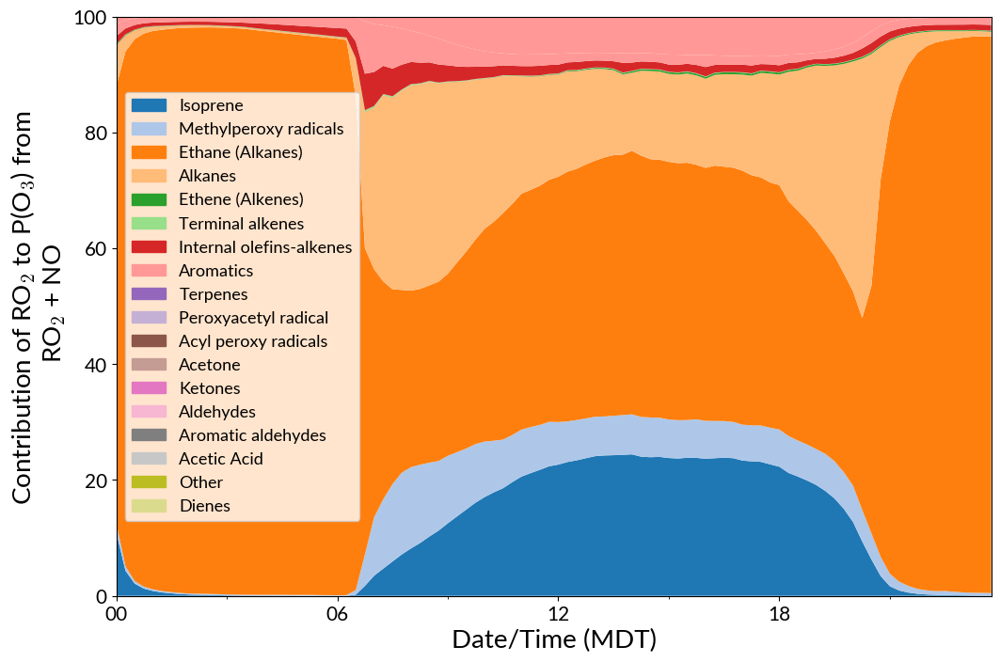

In [127]:
fig, ax = plt.subplots(figsize=(12,8))
ax.stackplot(new_day_index, frac_mean[:, :], labels=species_categories, colors=colors)

# Set x-axis formatting
import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0,6,12,18]))
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0,3,6,9,12,15,18,21]))

plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.margins(y=0)

# Make legend show only categories, not individual species
from matplotlib.patches import Patch
handles = [Patch(color=cat_colors[cat], label=cat) for cat in unique_cats]
plt.legend(handles=handles)

plt.show()

(55, 96)
['ISOP', 'MO2', 'ETHP', 'HC3P', 'HC5P', 'ETEP', 'OLTP', 'OLIP', 'BENP', 'TOLP', 'XYLP', 'EBZP', 'APIP1', 'APIP2', 'APINP1', 'APINP2', 'LIMP1', 'LIMP2', 'LIMNP1', 'LIMNP2', 'ACO3', 'RCO3', 'ACTP', 'KETP', 'MACP', 'MCP', 'MVKP', 'UALP', 'BALP', 'BAL1', 'ORAP', 'OLNN', 'OLND', 'BDE13P', 'FURANO2', 'SESQNRO2', 'SESQRO2', 'VROCP6ALKP', 'VROCP5ALKP', 'VROCP4ALKP', 'VROCP3ALKP', 'VROCP2ALKP', 'VROCP1ALKP', 'HC10P', 'VROCP6ALKP2', 'VROCP5ALKP2', 'VROCP4ALKP2', 'VROCP3ALKP2', 'VROCP2ALKP2', 'VROCP1ALKP2', 'HC10P2', 'VROCP6AROP', 'VROCP5AROP', 'NAPHP', 'STYP']
96


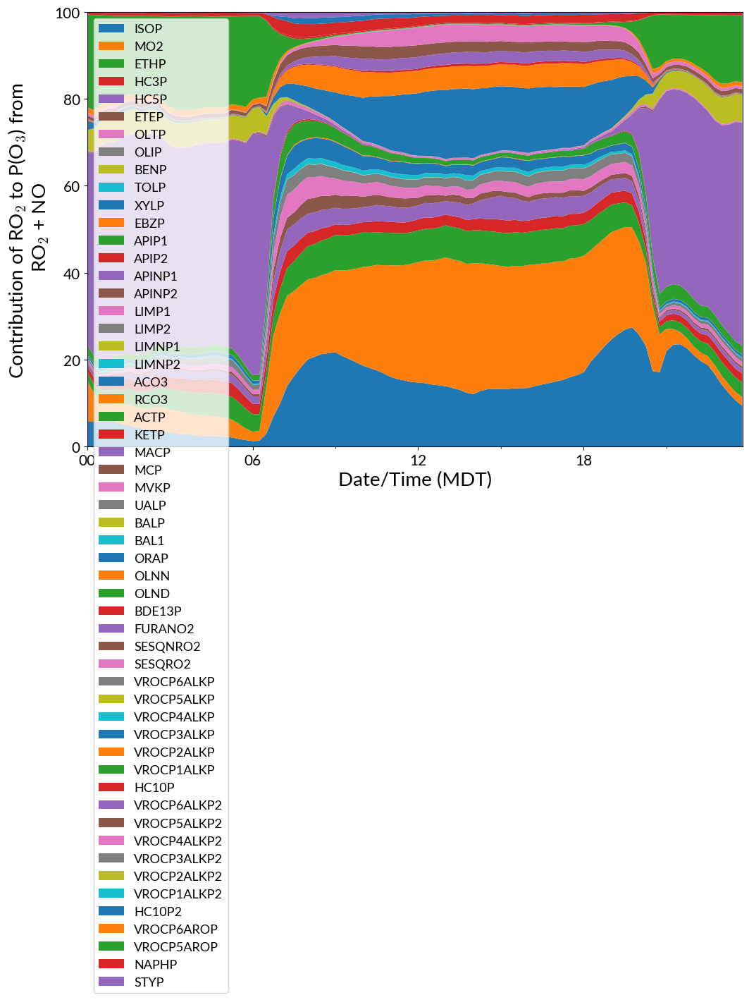

In [94]:
mech = 'CRACMM'
runs_arr = np.stack([v['RO2_NO_scaled_rates'] for v in all_runs[mech].values()], axis=0)

# Sum over species
sum_total = np.sum(runs_arr, axis=1)

# Fractional contribution
frac_contribution = runs_arr / sum_total[:, None, :] * 100

# Average over all days
frac_mean = np.mean(frac_contribution, axis=0)
print(np.shape(frac_mean))

# Access the RO2 labels
species_labels = RO2_labels[mech]

print(species_labels)

day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))

fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, frac_mean[:,:], labels = species_labels)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

(69, 96)
['MO2', 'MCO3', 'ETO2', 'OTHRO2', 'A3O2', 'PO2', 'R7O2', 'R7N1', 'BUTO2', 'ACRO2', 'ACO3', 'ALK4O2', 'ALK4N1', 'R4O2', 'R4N1', 'ATO2', 'KO2', 'B3O2', 'PRN1', 'RCO3', 'KO2', 'MEKCO3', 'GCO3', 'APINO2', 'PINO3', 'C96O2', 'BPINO2', 'BPINOO2', 'LIMO2', 'LIMKO2', 'LIMO3', 'PIO2', 'OLNN', 'OLND', 'IHOO1', 'IHOO1', 'IHOO4', 'IHOO4', 'IHPOO1', 'IHPOO2', 'IHPOO3', 'IEPOXAOO', 'IEPOXBOO', 'ICHOO', 'HPALD1OO', 'HPALD2OO', 'ISOPNOO1', 'ISOPNOO2', 'IDHNDOO1', 'IDHNDOO2', 'IDHNBOO', 'INO2B', 'INO2D', 'IHPNBOO', 'IHPNDOO', 'IDNOO', 'C4HVP1', 'C4HVP2', 'MVKOHOO', 'MCROHOO', 'MACR1OO', 'MACRNO2', 'ZRO2', 'ETOO', 'AROMRO2', 'TLFUO2', 'AROMCO3', 'BZCO3', 'BENZO2']
96


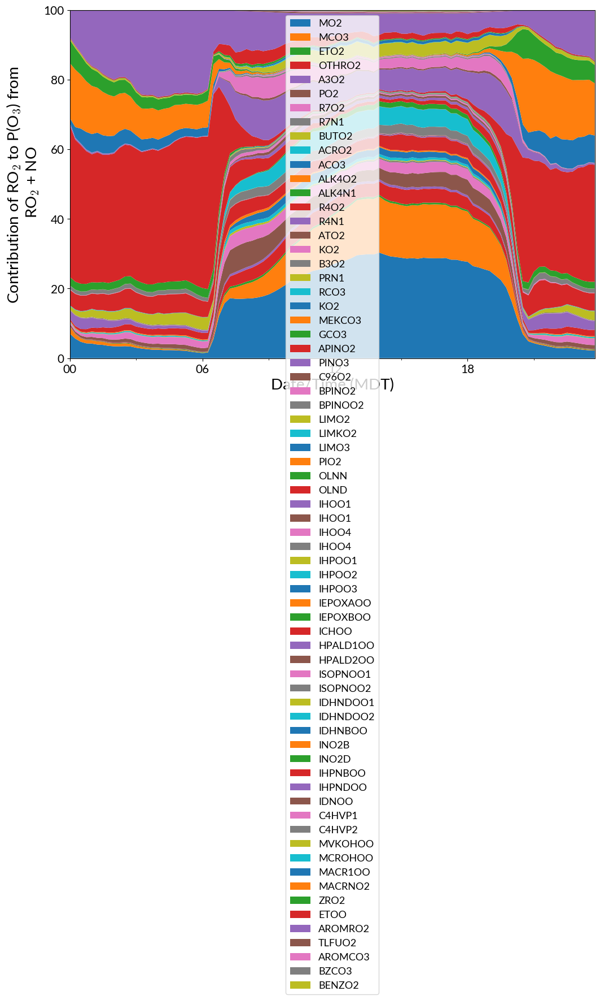

In [96]:
mech = 'GEOS-Chem'
runs_arr = np.stack([v['RO2_NO_scaled_rates'] for v in all_runs[mech].values()], axis=0)

# Sum over species
sum_total = np.sum(runs_arr, axis=1)

# Fractional contribution
frac_contribution = runs_arr / sum_total[:, None, :] * 100

# Average over all days
frac_mean = np.mean(frac_contribution, axis=0)
print(np.shape(frac_mean))

# Access the RO2 labels
species_labels = RO2_labels[mech]

print(species_labels)

day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))


fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, frac_mean[:,:], labels = species_labels)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

In [ ]:
for mech in mech_name:
    date_count = start_date
    while date_count <= end_date:
        print(date_count)
        run_month = date_count.month
        run_day  = date_count.day
        run_date = str(run_month) + '_' + str(run_day) + '_' + '2024'
        yaml_usos_dirpath = dirpath + 'F0AM-4.4.2/Runs/USOS_' + run_date
        yaml_usos_full_filepath_analysis = yaml_usos_dirpath + '/' + 'Run' + run_number + '/' + mech +'/USOS_' + run_date + '_' + mech + '_' + 'Run' + run_number + '_analysis_output' + '.yaml'
        print('Now loading file: ', yaml_usos_full_filepath_analysis)

        with open(yaml_usos_full_filepath_analysis, 'r') as f:
            yaml_usos_analysis = yaml.full_load(f)

        if mech == 'CB6r5h':
            CB6r5h_yaml_usos_analysis = yaml_usos_analysis
            if run_day == 4:
                CB6r5h_yaml_usos_analysis_0804 = CB6r5h_yaml_usos_analysis
            elif run_day == 5:
                CB6r5h_yaml_usos_analysis_0805 = CB6r5h_yaml_usos_analysis
            elif run_day == 6:
                CB6r5h_yaml_usos_analysis_0806 = CB6r5h_yaml_usos_analysis
            elif run_day == 7:
                CB6r5h_yaml_usos_analysis_0807 = CB6r5h_yaml_usos_analysis
            else:
                print('run_day invalid')

        elif mech == 'CRACMM':
            CRACMM_yaml_usos_analysis = yaml_usos_analysis
            if run_day == 4:
                CRACMM_yaml_usos_analysis_0804 = CRACMM_yaml_usos_analysis
            elif run_day == 5:
                CRACMM_yaml_usos_analysis_0805 = CRACMM_yaml_usos_analysis
            elif run_day == 6:
                CRACMM_yaml_usos_analysis_0806 = CRACMM_yaml_usos_analysis
            elif run_day == 7:
                CRACMM_yaml_usos_analysis_0807 = CRACMM_yaml_usos_analysis
            else:
                print('run_day invalid')

        elif mech == 'GEOS-Chem':
            GEOS_Chem_yaml_usos_analysis = yaml_usos_analysis
            if run_day == 4:
                GEOS_Chem_yaml_usos_analysis_0804 = GEOS_Chem_yaml_usos_analysis
            elif run_day == 5:
                GEOS_Chem_yaml_usos_analysis_0805 = GEOS_Chem_yaml_usos_analysis
            elif run_day == 6:
                GEOS_Chem_yaml_usos_analysis_0806 = GEOS_Chem_yaml_usos_analysis
            elif run_day == 7:
                GEOS_Chem_yaml_usos_analysis_0807 = GEOS_Chem_yaml_usos_analysis
            else:
                print('run_day invalid')

        elif mech == 'MCM':
            MCM_yaml_usos_analysis = yaml_usos_analysis
            if run_day == 4:
                MCM_yaml_usos_analysis_0804 = MCM_yaml_usos_analysis
            elif run_day == 5:
                MCM_yaml_usos_analysis_0805 = MCM_yaml_usos_analysis
            elif run_day == 6:
                MCM_yaml_usos_analysis_0806 = MCM_yaml_usos_analysis
            elif run_day == 7:
                MCM_yaml_usos_analysis_0807 = MCM_yaml_usos_analysis
            else:
                print('run_day invalid')

        else:
            print('Mechanism name invalid')

        processed_data_species_conc = {k: [item[0] if isinstance(item, list) else item for item in v] for k, v in yaml_usos_species_conc.items()}
        df_yaml_species_conc = pd.DataFrame(processed_data_species_conc)

        
        if mech == 'CB6r5h':
            df_CB6r5h_species_conc = pd.concat([df_CB6r5h_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'CRACMM':
            df_CRACMM_species_conc = pd.concat([df_CRACMM_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'GEOS-Chem':
            df_GEOSChem_species_conc = pd.concat([df_GEOSChem_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'MCM':
            df_MCM_species_conc = pd.concat([df_MCM_species_conc, df_yaml_species_conc], ignore_index=True)
        else:
            print('Mechanism name invalid')

Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_4_2024/Run48/CB6r5h/USOS_8_4_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_4_2024/Run48/CB6r5h/USOS_8_4_2024_CB6r5h_Run48_analysis_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_5_2024/Run48/CB6r5h/USOS_8_5_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_5_2024/Run48/CB6r5h/USOS_8_5_2024_CB6r5h_Run48_analysis_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_6_2024/Run48/CB6r5h/USOS_8_6_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared

In [149]:
#Loading species conc only

for mech in mech_name:
    for run_day in range(4,8):
        run_date = run_month + '_' + str(run_day) + '_' + '2024'
        yaml_usos_dirpath = dirpath + 'F0AM-4.4.2/Runs/USOS_' + run_date
        yaml_usos_full_filepath_species_conc = yaml_usos_dirpath + '/' + 'Run' + run_number + '/' + mech +'/USOS_' + run_date + '_' + mech + '_' + 'Run' + run_number + '_species_conc_output' + '.yaml'
        print('Now loading file: ', yaml_usos_full_filepath_species_conc)


        with open(yaml_usos_full_filepath_species_conc, 'r') as f:
            yaml_usos_species_conc = yaml.full_load(f)

        processed_data_species_conc = {k: [item[0] if isinstance(item, list) else item for item in v] for k, v in yaml_usos_species_conc.items()}
        df_yaml_species_conc = pd.DataFrame(processed_data_species_conc)

        
        if mech == 'CB6r5h':
            df_CB6r5h_species_conc = pd.concat([df_CB6r5h_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'CRACMM':
            df_CRACMM_species_conc = pd.concat([df_CRACMM_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'GEOS-Chem':
            df_GEOSChem_species_conc = pd.concat([df_GEOSChem_species_conc, df_yaml_species_conc], ignore_index=True)
        elif mech == 'MCM':
            df_MCM_species_conc = pd.concat([df_MCM_species_conc, df_yaml_species_conc], ignore_index=True)
        else:
            print('Mechanism name invalid')

Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_4_2024/Run48/CB6r5h/USOS_8_4_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_5_2024/Run48/CB6r5h/USOS_8_5_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_6_2024/Run48/CB6r5h/USOS_8_6_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_7_2024/Run48/CB6r5h/USOS_8_7_2024_CB6r5h_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USOS_shared/F0AM-4.4.2/Runs/USOS_8_4_2024/Run48/CRACMM/USOS_8_4_2024_CRACMM_Run48_species_conc_output.yaml
Now loading file:  /uufs/chpc.utah.edu/common/home/haskins-group1/users/vsun/USO

In [126]:
new_start_time = pd.Timestamp('2024-08-04 00:00:00')
new_end_time = pd.Timestamp('2024-08-07 23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_index = pd.date_range(start=new_start_time, end=new_end_time, freq='15min')
print(len(new_index))

384


In [127]:
CB6r5h_ope_total    = CB6r5h_yaml_usos_analysis_0804['ope_total'] + CB6r5h_yaml_usos_analysis_0805['ope_total'] + CB6r5h_yaml_usos_analysis_0806['ope_total'] + CB6r5h_yaml_usos_analysis_0807['ope_total']
CRACMM_ope_total    = CRACMM_yaml_usos_analysis_0804['ope_total'] + CRACMM_yaml_usos_analysis_0805['ope_total'] + CRACMM_yaml_usos_analysis_0806['ope_total'] + CRACMM_yaml_usos_analysis_0807['ope_total']
GEOS_Chem_ope_total = GEOS_Chem_yaml_usos_analysis_0804['ope_total'] + GEOS_Chem_yaml_usos_analysis_0805['ope_total'] + GEOS_Chem_yaml_usos_analysis_0806['ope_total'] + GEOS_Chem_yaml_usos_analysis_0807['ope_total']
MCM_ope_total       = MCM_yaml_usos_analysis_0804['ope_total'] + MCM_yaml_usos_analysis_0805['ope_total'] + MCM_yaml_usos_analysis_0806['ope_total'] + MCM_yaml_usos_analysis_0807['ope_total']

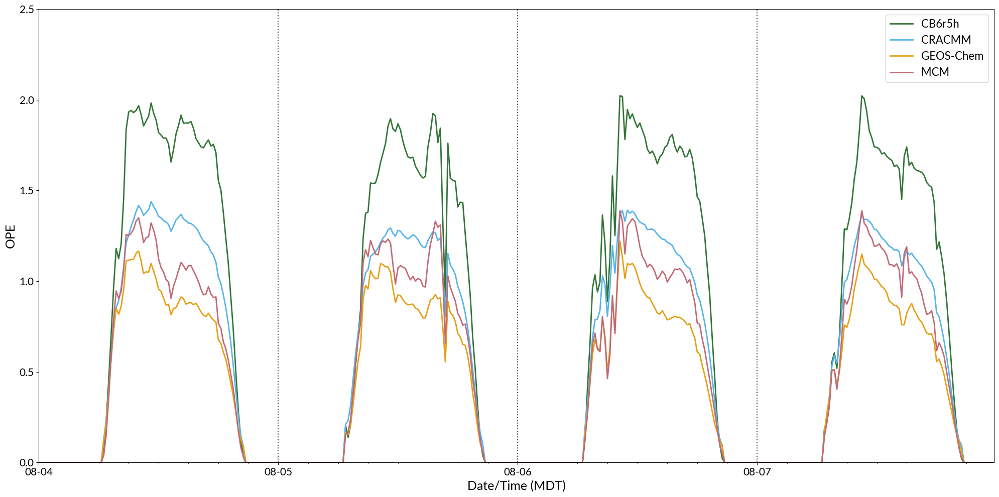

In [128]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.plot(new_index, CB6r5h_ope_total, label = 'CB6r5h', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, CRACMM_ope_total, label = 'CRACMM', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, GEOS_Chem_ope_total, label = 'GEOS-Chem', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, MCM_ope_total, label = 'MCM',linewidth = 2, color = four_colorset1[3].tolist())
plt.legend()

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.margins(x=0,y=0)
plt.xlabel('Date/Time (MDT)')
plt.ylabel('OPE')
plt.ylim([0,2.5])
# plt.grid()
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ope_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

In [129]:
CB6r5h_RO2_NO_scaled_rates      = np.array(CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates']) + np.array(CB6r5h_yaml_usos_analysis_0805['RO2_NO_scaled_rates']) + np.array(CB6r5h_yaml_usos_analysis_0806['RO2_NO_scaled_rates']) + np.array(CB6r5h_yaml_usos_analysis_0807['RO2_NO_scaled_rates'])
CB6r5h_HO2_NO_rates             = np.array(CB6r5h_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0807['HO2_NO_rate'])
CB6r5h_lost_NOx_sum_rates       = np.array(CB6r5h_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

CRACMM_RO2_NO_scaled_rates      = np.array(CRACMM_yaml_usos_analysis_0804['RO2_NO_scaled_rates']) + np.array(CRACMM_yaml_usos_analysis_0805['RO2_NO_scaled_rates']) + np.array(CRACMM_yaml_usos_analysis_0806['RO2_NO_scaled_rates']) + np.array(CRACMM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'])
CRACMM_HO2_NO_rates             = np.array(CRACMM_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0807['HO2_NO_rate'])
CRACMM_lost_NOx_sum_rates       = np.array(CRACMM_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

GEOS_Chem_RO2_NO_scaled_rates   = np.array(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_scaled_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_scaled_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_scaled_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_scaled_rates'])
GEOS_Chem_HO2_NO_rates             = np.array(GEOS_Chem_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['HO2_NO_rate'])
GEOS_Chem_lost_NOx_sum_rates    = np.array(GEOS_Chem_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

MCM_RO2_NO_scaled_rates         = np.array(MCM_yaml_usos_analysis_0804['RO2_NO_scaled_rates']) + np.array(MCM_yaml_usos_analysis_0805['RO2_NO_scaled_rates']) + np.array(MCM_yaml_usos_analysis_0806['RO2_NO_scaled_rates']) + np.array(MCM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'])
MCM_HO2_NO_rates             = np.array(MCM_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0807['HO2_NO_rate'])
MCM_lost_NOx_sum_rates          = np.array(MCM_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0807['lost_NOx_sum_rates'])
# contribution_RO2_NO_CB6r5h      = (np.ndarray(CB6r5h_RO2_NO_scaled_rates) / np.ndarray(CB6r5h_lost_NOx_sum_rates))
# contribution_RO2_NO_CRACMM      = (np.ndarray(CRACMM_RO2_NO_scaled_rates) / np.ndarray(CRACMM_lost_NOx_sum_rates))
# contribution_RO2_NO_GEOS_Chem   = (np.ndarray(GEOS_Chem_RO2_NO_scaled_rates) / np.ndarray(GEOS_Chem_lost_NOx_sum_rates))
# contribution_RO2_NO_MCM         = (np.ndarray(MCM_RO2_NO_scaled_rates) / np.ndarray(MCM_lost_NOx_sum_rates))

# CB6r5h_ro2_labels               = CB6r5h_yaml_usos_analysis_0804['RO2_list']
# CRACMM_ro2_labels               = CRACMM_yaml_usos_analysis_0804['RO2_list']
# GEOS_Chem_ro2_labels            = GEOS_Chem_yaml_usos_analysis_0804['RO2_list']
# MCM_ro2_labels                  = MCM_yaml_usos_analysis_0804['RO2_list']

In [130]:
CB6r5h_RO2_NO_conversion_sum_rates      = np.array(CB6r5h_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates'])
CB6r5h_HO2_NO_rates             = np.array(CB6r5h_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(CB6r5h_yaml_usos_analysis_0807['HO2_NO_rate'])
CB6r5h_lost_NOx_sum_rates       = np.array(CB6r5h_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(CB6r5h_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

CRACMM_RO2_NO_conversion_sum_rates      = np.array(CRACMM_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates'])
CRACMM_HO2_NO_rates             = np.array(CRACMM_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(CRACMM_yaml_usos_analysis_0807['HO2_NO_rate'])
CRACMM_lost_NOx_sum_rates       = np.array(CRACMM_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(CRACMM_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

GEOS_Chem_RO2_NO_conversion_sum_rates   = np.array(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates'])
GEOS_Chem_HO2_NO_rates             = np.array(GEOS_Chem_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['HO2_NO_rate'])
GEOS_Chem_lost_NOx_sum_rates    = np.array(GEOS_Chem_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(GEOS_Chem_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

MCM_RO2_NO_conversion_sum_rates         = np.array(MCM_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates']) + np.array(MCM_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates']) + np.array(MCM_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates']) + np.array(MCM_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates'])
MCM_HO2_NO_rates             = np.array(MCM_yaml_usos_analysis_0804['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0805['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0806['HO2_NO_rate']) + np.array(MCM_yaml_usos_analysis_0807['HO2_NO_rate'])
MCM_lost_NOx_sum_rates          = np.array(MCM_yaml_usos_analysis_0804['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0805['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0806['lost_NOx_sum_rates']) + np.array(MCM_yaml_usos_analysis_0807['lost_NOx_sum_rates'])

In [131]:
CB6r5h_RO2_NO_conversion_sum_rates      = CB6r5h_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates'] + CB6r5h_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates'] + CB6r5h_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates'] + CB6r5h_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates']
CB6r5h_HO2_NO_rates             = CB6r5h_yaml_usos_analysis_0804['HO2_NO_rate'] + CB6r5h_yaml_usos_analysis_0805['HO2_NO_rate'] + CB6r5h_yaml_usos_analysis_0806['HO2_NO_rate'] + CB6r5h_yaml_usos_analysis_0807['HO2_NO_rate']
CB6r5h_PO3_sum = np.array(CB6r5h_RO2_NO_conversion_sum_rates) + np.array(CB6r5h_HO2_NO_rates)

CRACMM_RO2_NO_conversion_sum_rates      = CRACMM_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates'] + CRACMM_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates'] + CRACMM_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates'] + CRACMM_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates']
CRACMM_HO2_NO_rates             = CRACMM_yaml_usos_analysis_0804['HO2_NO_rate'] + CRACMM_yaml_usos_analysis_0805['HO2_NO_rate'] + CRACMM_yaml_usos_analysis_0806['HO2_NO_rate'] + CRACMM_yaml_usos_analysis_0807['HO2_NO_rate']
CRACMM_PO3_sum = np.array(CRACMM_RO2_NO_conversion_sum_rates) + np.array(CRACMM_HO2_NO_rates)

GEOS_Chem_RO2_NO_conversion_sum_rates   = GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates']
GEOS_Chem_HO2_NO_rates             = GEOS_Chem_yaml_usos_analysis_0804['HO2_NO_rate'] + GEOS_Chem_yaml_usos_analysis_0805['HO2_NO_rate'] + GEOS_Chem_yaml_usos_analysis_0806['HO2_NO_rate'] + GEOS_Chem_yaml_usos_analysis_0807['HO2_NO_rate']
GEOS_Chem_PO3_sum = np.array(GEOS_Chem_RO2_NO_conversion_sum_rates) + np.array(GEOS_Chem_HO2_NO_rates)

MCM_RO2_NO_conversion_sum_rates         = MCM_yaml_usos_analysis_0804['RO2_NO_conversion_sum_rates'] + MCM_yaml_usos_analysis_0805['RO2_NO_conversion_sum_rates'] + MCM_yaml_usos_analysis_0806['RO2_NO_conversion_sum_rates'] + MCM_yaml_usos_analysis_0807['RO2_NO_conversion_sum_rates']
MCM_HO2_NO_rates             = MCM_yaml_usos_analysis_0804['HO2_NO_rate'] + MCM_yaml_usos_analysis_0805['HO2_NO_rate'] + MCM_yaml_usos_analysis_0806['HO2_NO_rate'] + MCM_yaml_usos_analysis_0807['HO2_NO_rate']
MCM_PO3_sum = np.array(MCM_RO2_NO_conversion_sum_rates) + np.array(MCM_HO2_NO_rates)

In [132]:
CB6r5h_lost_NOx_sum_rates       = CB6r5h_yaml_usos_analysis_0804['lost_NOx_sum_rates'] + CB6r5h_yaml_usos_analysis_0805['lost_NOx_sum_rates'] + CB6r5h_yaml_usos_analysis_0806['lost_NOx_sum_rates'] + CB6r5h_yaml_usos_analysis_0807['lost_NOx_sum_rates']
CRACMM_lost_NOx_sum_rates       = CRACMM_yaml_usos_analysis_0804['lost_NOx_sum_rates'] + CRACMM_yaml_usos_analysis_0805['lost_NOx_sum_rates'] + CRACMM_yaml_usos_analysis_0806['lost_NOx_sum_rates'] + CRACMM_yaml_usos_analysis_0807['lost_NOx_sum_rates']
GEOS_Chem_lost_NOx_sum_rates    = GEOS_Chem_yaml_usos_analysis_0804['lost_NOx_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0805['lost_NOx_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0806['lost_NOx_sum_rates'] + GEOS_Chem_yaml_usos_analysis_0807['lost_NOx_sum_rates']
MCM_lost_NOx_sum_rates          = MCM_yaml_usos_analysis_0804['lost_NOx_sum_rates'] + MCM_yaml_usos_analysis_0805['lost_NOx_sum_rates'] + MCM_yaml_usos_analysis_0806['lost_NOx_sum_rates'] + MCM_yaml_usos_analysis_0807['lost_NOx_sum_rates']

In [133]:
CB6r5h_RO2_OPE = np.array(CB6r5h_RO2_NO_conversion_sum_rates) / np.array(CB6r5h_lost_NOx_sum_rates)
CRACMM_RO2_OPE = np.array(CRACMM_RO2_NO_conversion_sum_rates) / np.array(CRACMM_lost_NOx_sum_rates)
GEOS_Chem_RO2_OPE = np.array(GEOS_Chem_RO2_NO_conversion_sum_rates) / np.array(GEOS_Chem_lost_NOx_sum_rates)
MCM_RO2_OPE = np.array(MCM_RO2_NO_conversion_sum_rates) / np.array(MCM_lost_NOx_sum_rates)

In [134]:
plt.plot(new_index, CB6r5h_RO2_NO_conversion_sum_rates, label = 'CB6r5h, RO2 + NO', linewidth = 2, linestyle = 'solid', color = four_colorset1[0].tolist())
plt.plot(new_index, CB6r5h_HO2_NO_rates, label = 'CB6r5h, HO2 + NO', linewidth = 2, linestyle = 'dashed', color = four_colorset1[0].tolist())

plt.plot(new_index, CRACMM_RO2_NO_conversion_sum_rates, label = 'CRACMM, RO2 + NO',  linewidth = 2, linestyle = 'solid', color = four_colorset1[1].tolist())
plt.plot(new_index, CRACMM_HO2_NO_rates, label = 'CRACMM, HO2 + NO',  linewidth = 2, linestyle = 'dashed',color = four_colorset1[1].tolist())

plt.plot(new_index, GEOS_Chem_RO2_NO_conversion_sum_rates, label = 'GEOS-Chem, RO2 + NO',  linewidth = 2, linestyle = 'solid', color = four_colorset1[2].tolist())
plt.plot(new_index, GEOS_Chem_HO2_NO_rates, label = 'GEOS-Chem, HO2 + NO',  linewidth = 2,linestyle = 'dashed', color = four_colorset1[2].tolist())

plt.plot(new_index, MCM_RO2_NO_conversion_sum_rates, label = 'MCM, RO2 + NO',linewidth = 2, linestyle = 'solid',color = four_colorset1[3].tolist())
plt.plot(new_index, MCM_HO2_NO_rates, label = 'MCM, HO2 + NO',linewidth = 2, linestyle = 'dashed',color = four_colorset1[3].tolist())

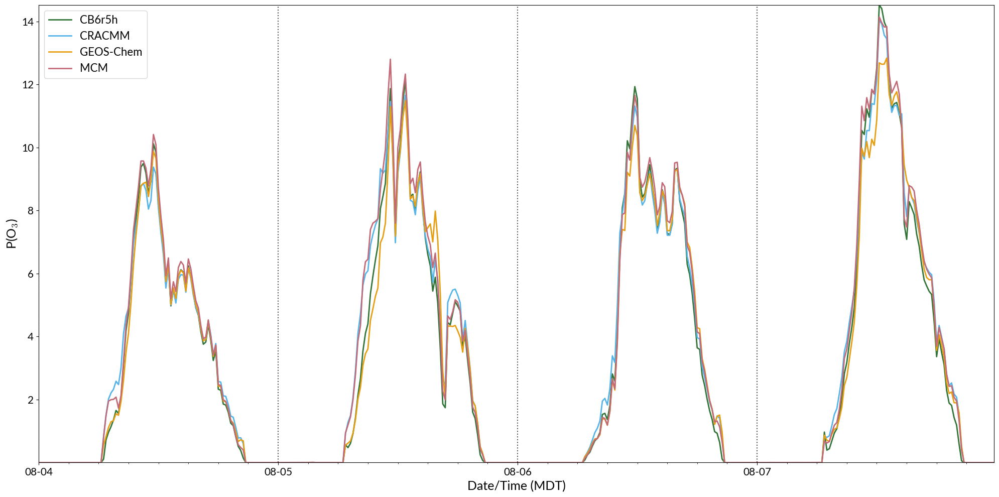

In [135]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.plot(new_index, CB6r5h_PO3_sum, label = 'CB6r5h', linewidth = 2, linestyle = 'solid', color = four_colorset1[0].tolist())
plt.plot(new_index, CRACMM_PO3_sum, label = 'CRACMM',  linewidth = 2, linestyle = 'solid', color = four_colorset1[1].tolist())
plt.plot(new_index, GEOS_Chem_PO3_sum, label = 'GEOS-Chem',  linewidth = 2, linestyle = 'solid', color = four_colorset1[2].tolist())
plt.plot(new_index, MCM_PO3_sum, label = 'MCM', linewidth = 2, linestyle = 'solid', color = four_colorset1[3].tolist())
plt.legend()

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.margins(x=0,y=0)
plt.xlabel('Date/Time (MDT)')
plt.ylabel('P(O$_3$)')
# plt.grid()
plt.savefig(dirpath + '/F0AM_run_analysis/plots/production_ozone_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

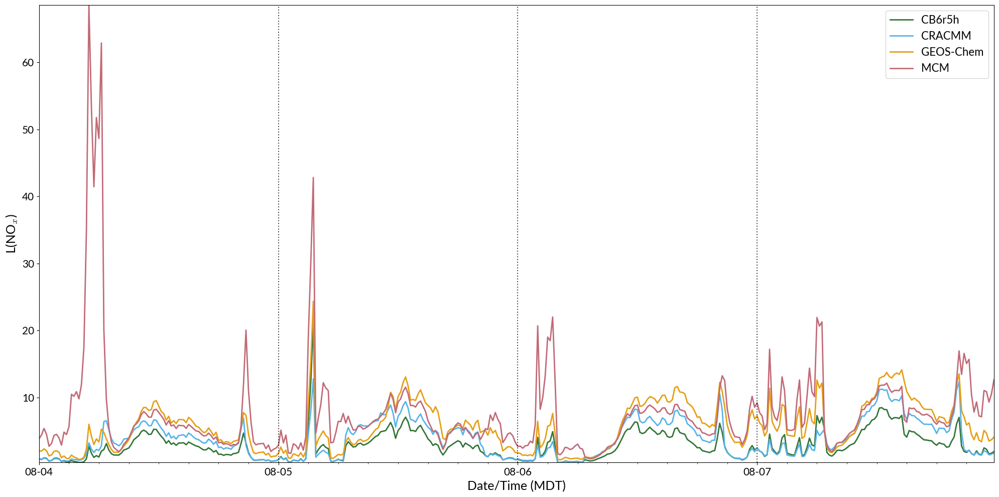

In [136]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.plot(new_index, CB6r5h_lost_NOx_sum_rates, label = 'CB6r5h', linewidth = 2, linestyle = 'solid', color = four_colorset1[0].tolist())
plt.plot(new_index, CRACMM_lost_NOx_sum_rates, label = 'CRACMM',  linewidth = 2, linestyle = 'solid', color = four_colorset1[1].tolist())
plt.plot(new_index, GEOS_Chem_lost_NOx_sum_rates, label = 'GEOS-Chem',  linewidth = 2, linestyle = 'solid', color = four_colorset1[2].tolist())
plt.plot(new_index, MCM_lost_NOx_sum_rates, label = 'MCM', linewidth = 2, linestyle = 'solid', color = four_colorset1[3].tolist())
plt.legend()

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.margins(x=0,y=0)
plt.xlabel('Date/Time (MDT)')
plt.ylabel('L(NO$_x$)')
# plt.grid()
plt.savefig(dirpath + '/F0AM_run_analysis/plots/loss_nox_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

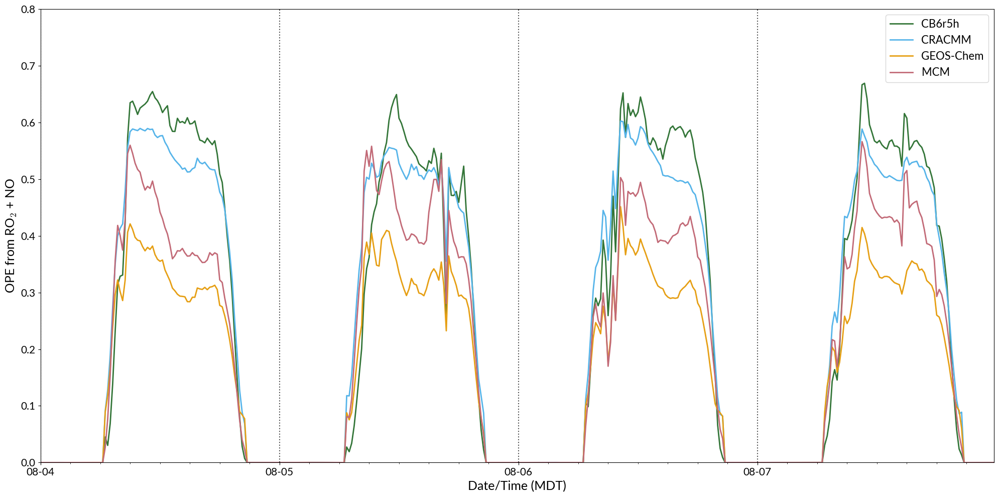

In [137]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.plot(new_index, CB6r5h_RO2_OPE, label = 'CB6r5h', linewidth = 2, linestyle = 'solid', color = four_colorset1[0].tolist())
plt.plot(new_index, CRACMM_RO2_OPE, label = 'CRACMM',  linewidth = 2, linestyle = 'solid', color = four_colorset1[1].tolist())
plt.plot(new_index, GEOS_Chem_RO2_OPE, label = 'GEOS-Chem',  linewidth = 2, linestyle = 'solid', color = four_colorset1[2].tolist())
plt.plot(new_index, MCM_RO2_OPE, label = 'MCM', linewidth = 2, linestyle = 'solid', color = four_colorset1[3].tolist())
plt.legend(loc ='upper right')

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.margins(x=0,y=0)
plt.xlabel('Date/Time (MDT)')
plt.ylabel('OPE from RO$_2$ + NO')
plt.ylim([0,0.8])
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ro2_no_ope_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

## RO2 Analysis

In [138]:
print(CB6r5h_yaml_usos_analysis_0804['RO2_NO_conversion_rxns'])
print(CRACMM_yaml_usos_analysis_0804['RO2_NO_conversion_rxns'])

['C2O3 + NO = MEO2+ NO2+ RO2', 'CXO3 + NO = ALD2+ XO2H+ NO2+ RO2', 'MEO2 + NO = FORM+ NO2+ HO2', 'HCO3 + NO = FACD+ NO2+ HO2', 'ISO2 + NO = 0.673FORM+ 0.1INTR+ 0.9ISPD+ 0.082XO2H+ 0.9NO2+ 0.082RO2+ 0.818HO2', 'EPX2 + NO = 0.375FORM+ 0.275GLY+ 0.275GLYD+ 0.275MGLY+ 2.175PAR+ NO2+ 0.251CO+ 0.125OH+ 0.825HO2', 'BZO2 + NO = 0.918GLY+ 0.082NTR2+ 0.918OPEN+ 0.918NO2+ 0.918HO2', 'NO + TO2 = 0.417GLY+ 0.443MGLY+ 0.14NTR2+ 0.66OPEN+ 0.2XOPN+ 0.86NO2+ 0.86HO2', 'NO + XLO2 = 0.221GLY+ 0.675MGLY+ 0.14NTR2+ 0.3OPEN+ 0.56XOPN+ 0.86NO2+ 0.86HO2', 'NO + OPO3 = 0.2CXO3+ 0.5GLY+ NO2+ 0.5CO+ 0.8HO2']
['ISOP + NO = 0.13000*ISON +  0.40000*HCHO +  0.88000*HO2 +  0.87000*NO2 +  0.18000*MACR +  0.51000*MVK ', 'MO2 + NO = HO2 + NO2 + HCHO ', 'ETHP + NO = HO2 + NO2 + ACD ', 'HC3P + NO = 0.66000*HO2 +  0.13100*MO2 +  0.04800*ETHP +  0.08900*XO2 +  0.93500*NO2 +  0.50400*ACD +  0.13200*ALD +  0.16500*ACT +  0.04200*MEK +  0.06500*ONIT ', 'HC5P + NO = 0.20000*HO2 +  0.05100*MO2 +  0.23100*ETHP +  0.23500*XO2 +  0

In [139]:
RO2_labels_CB6r5h = []
RO2_labels_CRACMM = []
RO2_labels_GEOS_Chem = []
RO2_labels_MCM = []

for rxn in CB6r5h_yaml_usos_analysis_0804['RO2_NO_conversion_rxns']:
    reactants = rxn.split('=')[0]
    if "+ NO" in reactants:
        species = reactants.split('+ NO')[0]
    elif "+NO" in reactants:
        species = reactants.split("+NO")[0]
    elif 'NO +' in reactants:
        print('Passing NO +: ', rxn)
        species = reactants.split('NO + ')[1]
        print(species)
    else:
        print('Split invalid')

    RO2_labels_CB6r5h.append(species.strip())

for rxn in CRACMM_yaml_usos_analysis_0804['RO2_NO_conversion_rxns']:
    reactants = rxn.split('=')[0]
    if "+ NO" in reactants:
        species = reactants.split('+ NO')[0]
    elif "+NO" in reactants:
        species = reactants.split("+NO")[0]
    elif 'NO +' in reactants:
        print('Passing NO +: ', rxn)
        species = reactants.split('NO + ')[1]
        print(species)
    else:
        print('Split invalid')

    RO2_labels_CRACMM.append(species.strip())

for rxn in GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_conversion_rxns']:
    reactants = rxn.split('=')[0]
    if "+ NO" in reactants:
        species = reactants.split('+ NO')[0]
    elif "+NO" in reactants:
        species = reactants.split("+NO")[0]
    elif 'NO +' in reactants:
        print('Passing NO +: ', rxn)
        species = reactants.split('NO + ')[1]
        print(species)
    else:
        print('Split invalid')

    RO2_labels_GEOS_Chem.append(species.strip())

for rxn in MCM_yaml_usos_analysis_0804['RO2_NO_conversion_rxns']:
    reactants = rxn.split('=')[0]
    if " + NO" in reactants:
        species = reactants.split('+ NO')[0]
    elif "+NO" in reactants:
        species = reactants.split("+NO")[0]
    elif 'NO +' in reactants:
        print('Passing NO +: ', rxn)
        species = reactants.split('NO + ')[1]
        print(species)
    else:
        print('Split invalid')

    RO2_labels_MCM.append(species.strip())


Passing NO +:  NO + TO2 = 0.417GLY+ 0.443MGLY+ 0.14NTR2+ 0.66OPEN+ 0.2XOPN+ 0.86NO2+ 0.86HO2
TO2 
Passing NO +:  NO + XLO2 = 0.221GLY+ 0.675MGLY+ 0.14NTR2+ 0.3OPEN+ 0.56XOPN+ 0.86NO2+ 0.86HO2
XLO2 
Passing NO +:  NO + OPO3 = 0.2CXO3+ 0.5GLY+ NO2+ 0.5CO+ 0.8HO2
OPO3 
Passing NO +:  NO + HYPROPO2 = HYPROPO + NO2
HYPROPO2 


In [140]:
print(RO2_labels_CB6r5h)
print(RO2_labels_CRACMM)
print(RO2_labels_GEOS_Chem)
print(RO2_labels_MCM)

['C2O3', 'CXO3', 'MEO2', 'HCO3', 'ISO2', 'EPX2', 'BZO2', 'TO2', 'XLO2', 'OPO3']
['ISOP', 'MO2', 'ETHP', 'HC3P', 'HC5P', 'ETEP', 'OLTP', 'OLIP', 'BENP', 'TOLP', 'XYLP', 'EBZP', 'APIP1', 'APIP2', 'APINP1', 'APINP2', 'LIMP1', 'LIMP2', 'LIMNP1', 'LIMNP2', 'ACO3', 'RCO3', 'ACTP', 'KETP', 'MACP', 'MCP', 'MVKP', 'UALP', 'BALP', 'BAL1', 'ORAP', 'OLNN', 'OLND', 'BDE13P', 'FURANO2', 'SESQNRO2', 'SESQRO2', 'VROCP6ALKP', 'VROCP5ALKP', 'VROCP4ALKP', 'VROCP3ALKP', 'VROCP2ALKP', 'VROCP1ALKP', 'HC10P', 'VROCP6ALKP2', 'VROCP5ALKP2', 'VROCP4ALKP2', 'VROCP3ALKP2', 'VROCP2ALKP2', 'VROCP1ALKP2', 'HC10P2', 'VROCP6AROP', 'VROCP5AROP', 'NAPHP', 'STYP']
['MO2', 'MCO3', 'ETO2', 'OTHRO2', 'A3O2', 'PO2', 'R7O2', 'R7N1', 'BUTO2', 'ACRO2', 'ACO3', 'ALK4O2', 'ALK4N1', 'R4O2', 'R4N1', 'ATO2', 'KO2', 'B3O2', 'PRN1', 'RCO3', 'KO2', 'MEKCO3', 'GCO3', 'APINO2', 'PINO3', 'C96O2', 'BPINO2', 'BPINOO2', 'LIMO2', 'LIMKO2', 'LIMO3', 'PIO2', 'OLNN', 'OLND', 'IHOO1', 'IHOO1', 'IHOO4', 'IHOO4', 'IHPOO1', 'IHPOO2', 'IHPOO3', 'IEPO

In [141]:
print(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_conversion_rxns'][32])

OLNN+NO=HO2+NO2+MONITS


In [142]:
CB6r5h_sum_total_ro2_prod_CB6r5h = np.vstack([
    np.sum(CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates'],axis=0),
    np.sum(CB6r5h_yaml_usos_analysis_0805['RO2_NO_scaled_rates'],axis=0),
    np.sum(CB6r5h_yaml_usos_analysis_0806['RO2_NO_scaled_rates'],axis=0),
    np.sum(CB6r5h_yaml_usos_analysis_0807['RO2_NO_scaled_rates'],axis=0)
    ])
print(np.shape(CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates']))

CB6r5h_ro2_fractional_contribution= np.vstack([
    CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / CB6r5h_sum_total_ro2_prod_CB6r5h[0] * 100,
    CB6r5h_yaml_usos_analysis_0805['RO2_NO_scaled_rates'] / CB6r5h_sum_total_ro2_prod_CB6r5h[1] * 100,
    CB6r5h_yaml_usos_analysis_0806['RO2_NO_scaled_rates'] / CB6r5h_sum_total_ro2_prod_CB6r5h[2] * 100,
    CB6r5h_yaml_usos_analysis_0807['RO2_NO_scaled_rates'] / CB6r5h_sum_total_ro2_prod_CB6r5h[3] * 100
    ])

CRACMM_sum_total_ro2_prod_CRACMM = np.vstack([
    np.sum(CRACMM_yaml_usos_analysis_0804['RO2_NO_scaled_rates'],axis=0),
    np.sum(CRACMM_yaml_usos_analysis_0805['RO2_NO_scaled_rates'],axis=0),
    np.sum(CRACMM_yaml_usos_analysis_0806['RO2_NO_scaled_rates'],axis=0),
    np.sum(CRACMM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'],axis=0)
    ])
print(np.shape(CRACMM_yaml_usos_analysis_0804['RO2_NO_scaled_rates']))

CRACMM_ro2_fractional_contribution= np.vstack([
    CRACMM_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / CRACMM_sum_total_ro2_prod_CRACMM[0] * 100,
    CRACMM_yaml_usos_analysis_0805['RO2_NO_scaled_rates'] / CRACMM_sum_total_ro2_prod_CRACMM[1] * 100,
    CRACMM_yaml_usos_analysis_0806['RO2_NO_scaled_rates'] / CRACMM_sum_total_ro2_prod_CRACMM[2] * 100,
    CRACMM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'] / CRACMM_sum_total_ro2_prod_CRACMM[3] * 100
    ])

GEOS_Chem_sum_total_ro2_prod_GEOS_Chem = np.vstack([
    np.sum(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_scaled_rates'],axis=0),
    np.sum(GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_scaled_rates'],axis=0),
    np.sum(GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_scaled_rates'],axis=0),
    np.sum(GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_scaled_rates'],axis=0)
    ])
print(np.shape(GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_scaled_rates']))

GEOS_Chem_ro2_fractional_contribution= np.vstack([
    GEOS_Chem_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / GEOS_Chem_sum_total_ro2_prod_GEOS_Chem[0] * 100,
    GEOS_Chem_yaml_usos_analysis_0805['RO2_NO_scaled_rates'] / GEOS_Chem_sum_total_ro2_prod_GEOS_Chem[1] * 100,
    GEOS_Chem_yaml_usos_analysis_0806['RO2_NO_scaled_rates'] / GEOS_Chem_sum_total_ro2_prod_GEOS_Chem[2] * 100,
    GEOS_Chem_yaml_usos_analysis_0807['RO2_NO_scaled_rates'] / GEOS_Chem_sum_total_ro2_prod_GEOS_Chem[3] * 100
    ])

MCM_sum_total_ro2_prod_MCM = np.vstack([
    np.sum(MCM_yaml_usos_analysis_0804['RO2_NO_scaled_rates'],axis=0),
    np.sum(MCM_yaml_usos_analysis_0805['RO2_NO_scaled_rates'],axis=0),
    np.sum(MCM_yaml_usos_analysis_0806['RO2_NO_scaled_rates'],axis=0),
    np.sum(MCM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'],axis=0)
    ])
print(np.shape(MCM_yaml_usos_analysis_0804['RO2_NO_scaled_rates']))

MCM_ro2_fractional_contribution= np.vstack([
    MCM_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / MCM_sum_total_ro2_prod_MCM[0] * 100,
    MCM_yaml_usos_analysis_0805['RO2_NO_scaled_rates'] / MCM_sum_total_ro2_prod_MCM[1] * 100,
    MCM_yaml_usos_analysis_0806['RO2_NO_scaled_rates'] / MCM_sum_total_ro2_prod_MCM[2] * 100,
    MCM_yaml_usos_analysis_0807['RO2_NO_scaled_rates'] / MCM_sum_total_ro2_prod_MCM[3] * 100
    ])



(10, 96)
(55, 96)
(69, 96)
(1233, 96)


In [143]:
day_start_time = pd.Timestamp('00:00:00')
day_end_time = pd.Timestamp('23:45:00')
#Create a new datetime index from new_start to the end of existing index with same frequency
new_day_index = pd.date_range(start=day_start_time, end=day_end_time, freq='15min')
print(len(new_day_index))

96


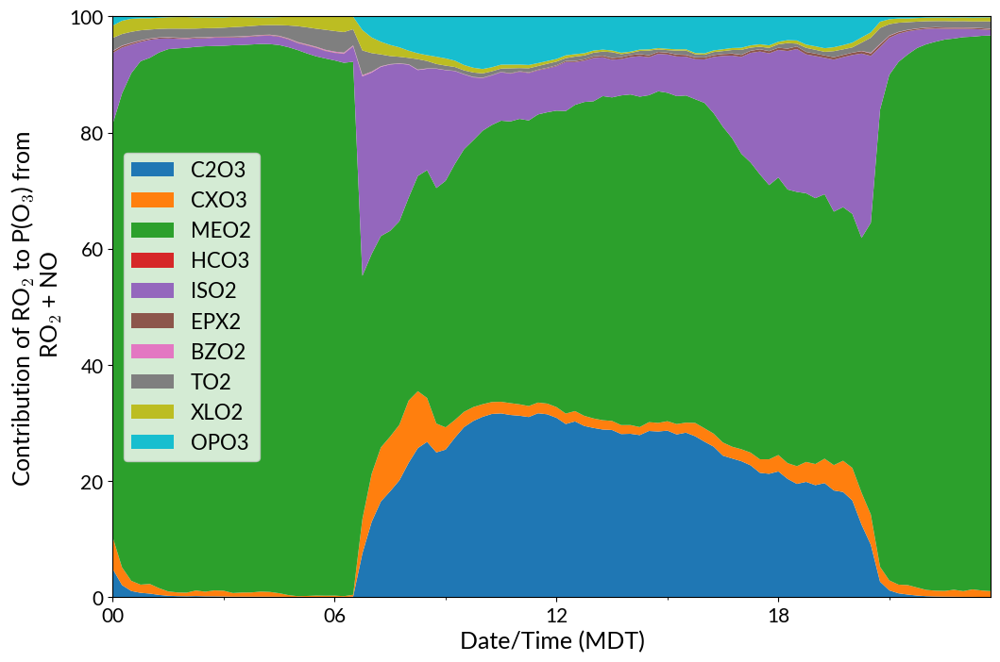

In [144]:
#DAY 1: 0804
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CB6r5h_ro2_fractional_contribution[0:10,:], labels = RO2_labels_CB6r5h)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

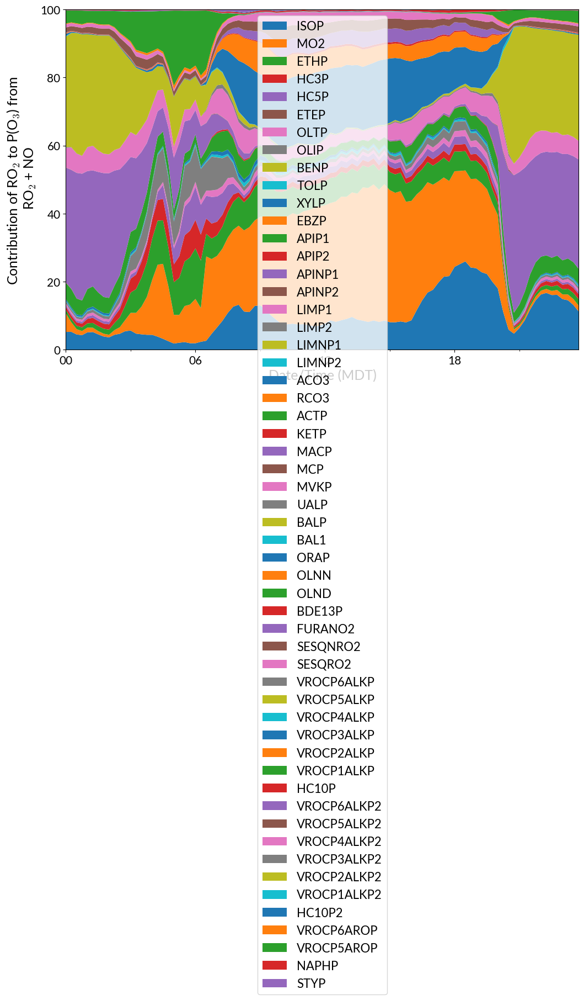

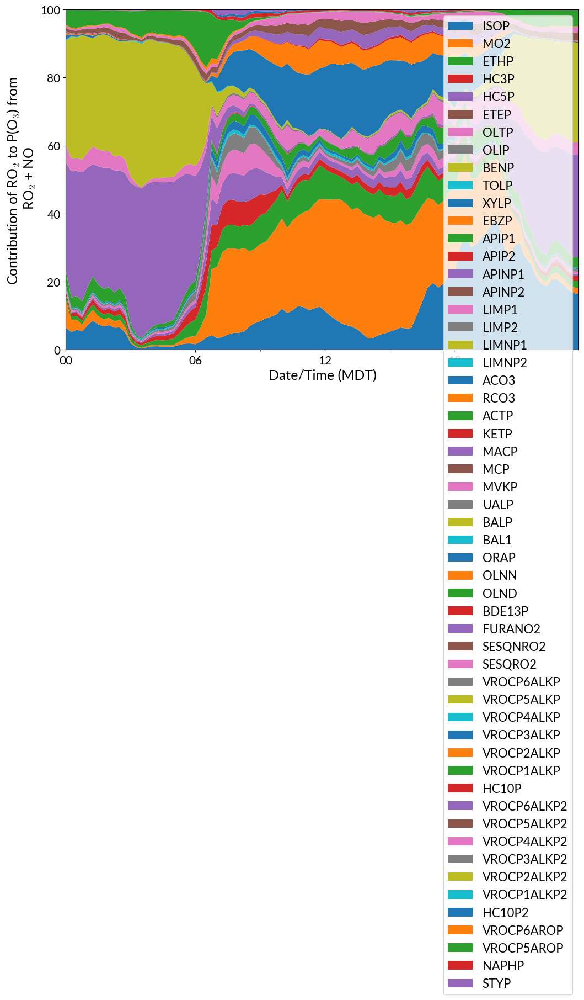

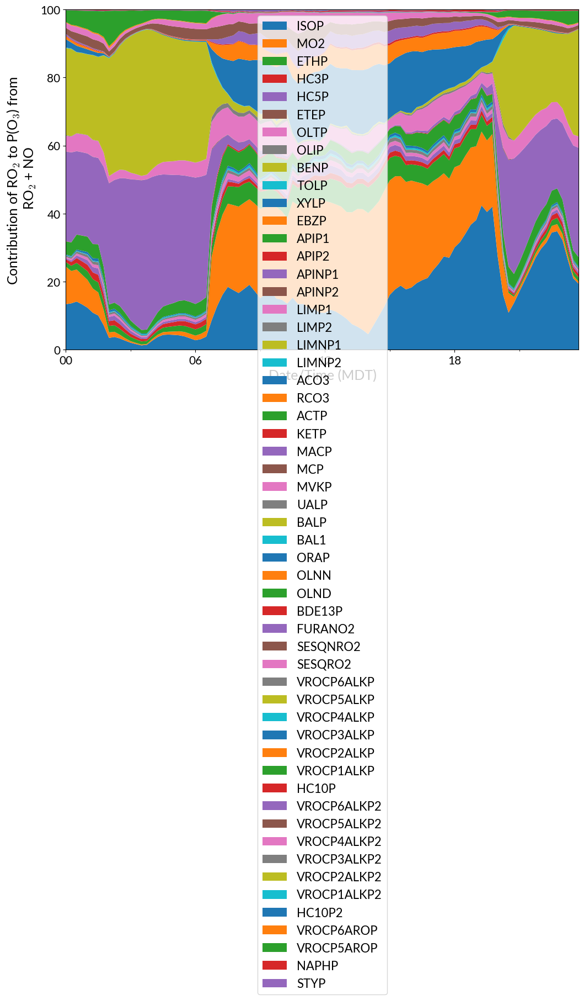

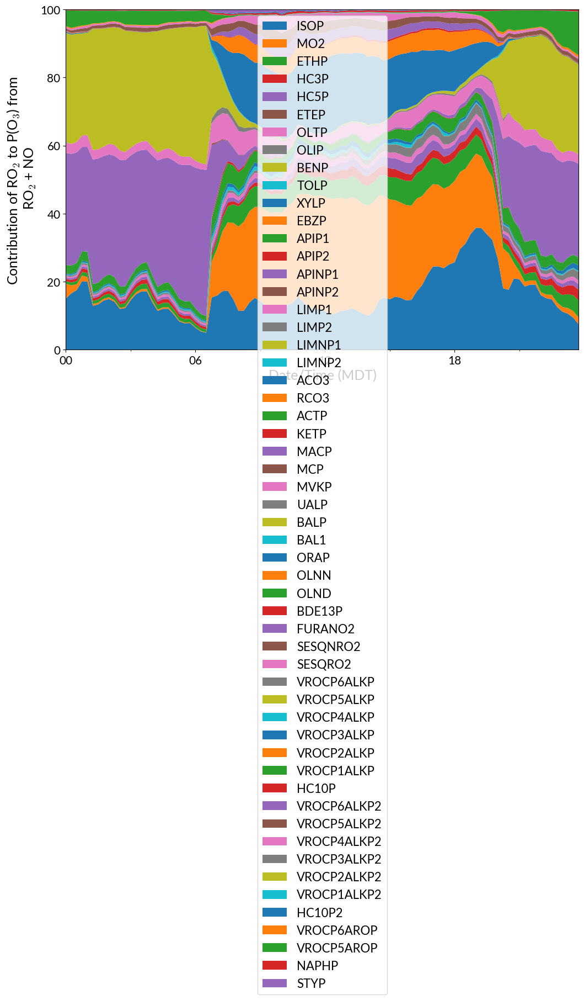

In [145]:
#DAY 1: 0804
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CRACMM_ro2_fractional_contribution[0:55,:], labels = RO2_labels_CRACMM)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

#DAY 2: 0805
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CRACMM_ro2_fractional_contribution[55:55*2,:], labels = RO2_labels_CRACMM)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

#DAY 3: 0806
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CRACMM_ro2_fractional_contribution[55*2:55*3,:], labels = RO2_labels_CRACMM)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

#DAY 4: 0806
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, CRACMM_ro2_fractional_contribution[55*3:55*4,:], labels = RO2_labels_CRACMM)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

In [123]:
for spec in RO2_labels_GEOS_Chem:
    if 'OLNN' in spec:
        print(RO2_labels_GEOS_Chem.index(spec))
    else:
        pass

32


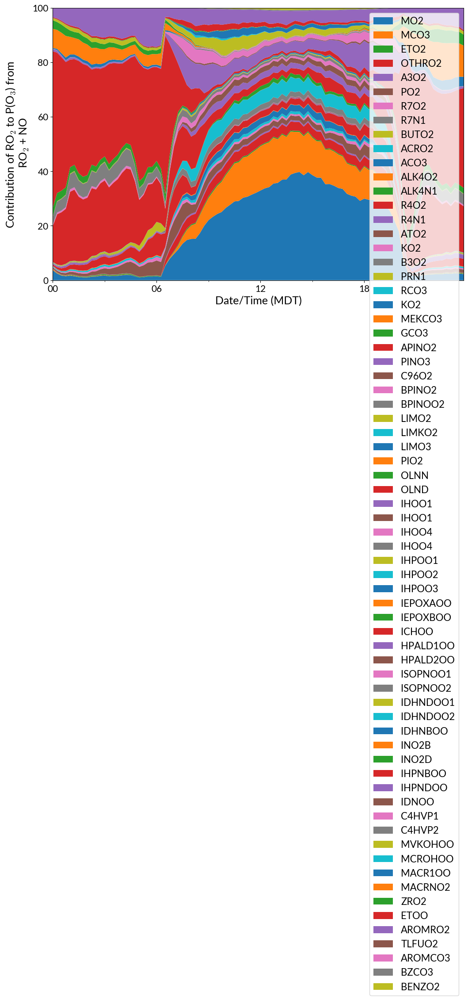

In [146]:
#DAY 1: 0804
fix, ax = plt.subplots(figsize=(12,8))
plt.stackplot(new_day_index, GEOS_Chem_ro2_fractional_contribution[0:69,:], labels = RO2_labels_GEOS_Chem)

ax.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
plt.legend()
plt.margins(y=0)
plt.ylabel('Contribution of RO$_2$ to P(O$_3$) from \n RO$_2$ + NO')
plt.xlabel('Date/Time (MDT)')
plt.show()

In [ ]:
ro2_fraction_contribution_CB6r5h = (CB6r5h_yaml_usos_analysis_0804['RO2_NO_scaled_rates'] / sum_total_voc_prod)*100

df_geoschem_ro2['Fractional Contribution of VOC'] = [spec for spec in voc_fraction]

## Ozone Time Series

In [150]:
df_CB6r5h_hrly_species_conc = df_CB6r5h_species_conc.copy()
print(df_CB6r5h_hrly_species_conc)
df_CRACMM_hrly_species_conc = df_CRACMM_species_conc.copy()
df_GEOSChem_hrly_species_conc = df_GEOSChem_species_conc.copy()
df_MCM_hrly_species_conc = df_MCM_species_conc.copy()

df_CB6r5h_hrly_species_conc.set_index(new_index, inplace=True)
df_CRACMM_hrly_species_conc.set_index(new_index, inplace=True)
df_GEOSChem_hrly_species_conc.set_index(new_index, inplace=True)
df_MCM_hrly_species_conc.set_index(new_index, inplace=True)

hour_range = np.arange(0,24,1)

     O3Initconc     O3conc  NOInitconc        NOconc  NO2Initconc   NO2conc  \
0     44.585778  44.128407    0.086469  1.742353e-06     1.991506  2.077974   
1     44.374667  43.695325    0.314791  1.070821e-06     1.972488  2.287277   
2     42.908889  43.323696    0.294459  1.274083e-06     2.520365  2.814823   
3     42.900000  43.020928    0.110087  9.647658e-07     2.483201  2.593286   
4     43.119111  42.734874    0.096860  2.952621e-07     1.681178  1.778038   
..          ...        ...         ...           ...          ...       ...   
379   49.891111  45.810237    0.192904  1.271317e-06     3.813621  4.006524   
380   49.955111  45.163786    0.513091  1.101016e-06     3.296744  3.809835   
381   52.039111  44.570162    0.416032  6.856234e-07     2.733300  3.149331   
382   52.240889  44.053084    0.350160  7.419489e-07     2.973396  3.323555   
383   49.746667  43.553381    0.054440  8.362391e-07     3.731194  3.785633   

     HO2Initconc   HO2conc  HONOInitconc  HONOconc 

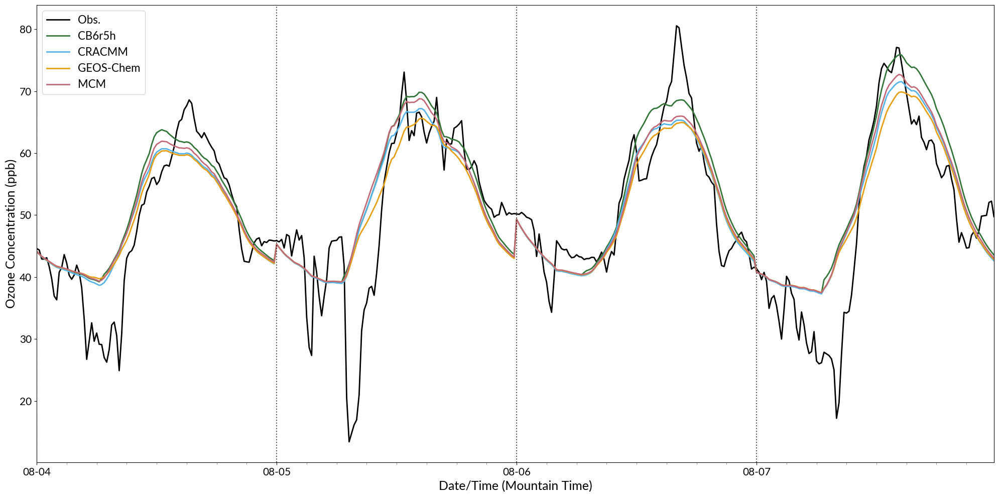

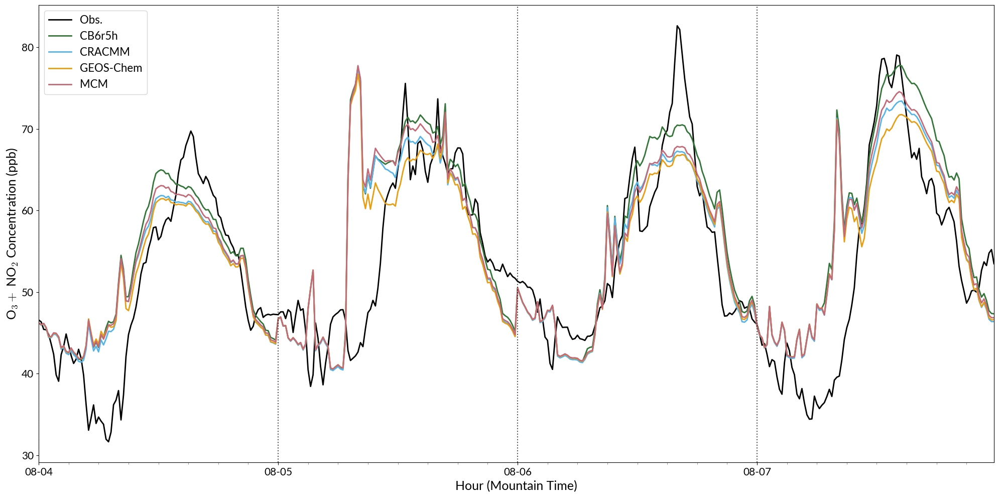

In [151]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index,df_CRACMM_species_conc['O3conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index,df_GEOSChem_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index,df_MCM_species_conc['O3conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Date/Time (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('Ozone Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('O$_3 + $ NO$_2$ Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/o3_no2_sum_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

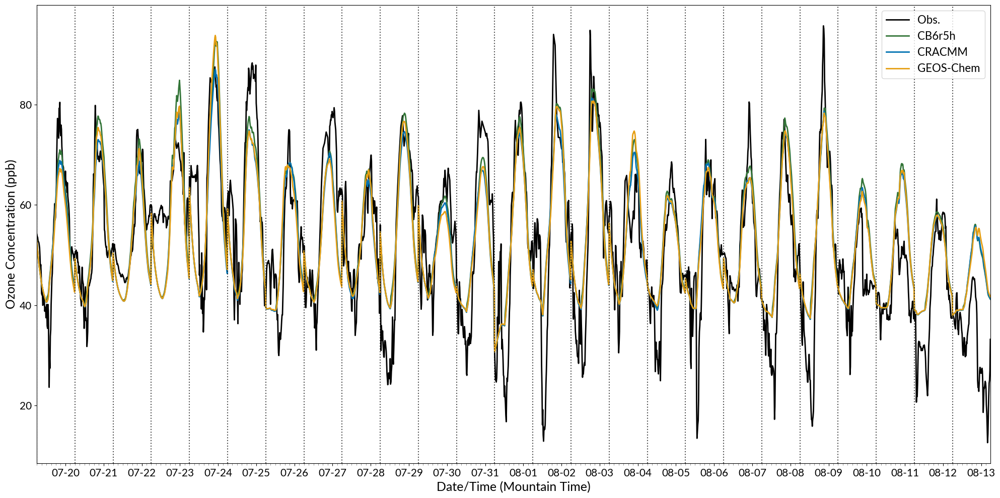

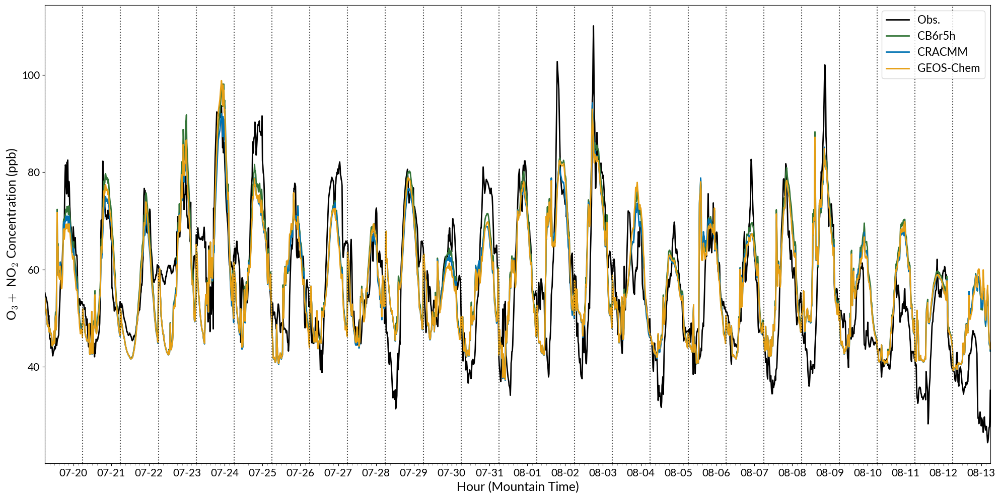

In [17]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index,df_CRACMM_species_conc['O3conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index,df_GEOSChem_species_conc['O3conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index,df_MCM_species_conc['O3conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Date/Time (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('Ozone Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
#plt.savefig(dirpath + '/F0AM_run_analysis/plots/ozone_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
# plt.plot(new_index, df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('O$_3 + $ NO$_2$ Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
#plt.savefig(dirpath + '/F0AM_run_analysis/plots/o3_no2_sum_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

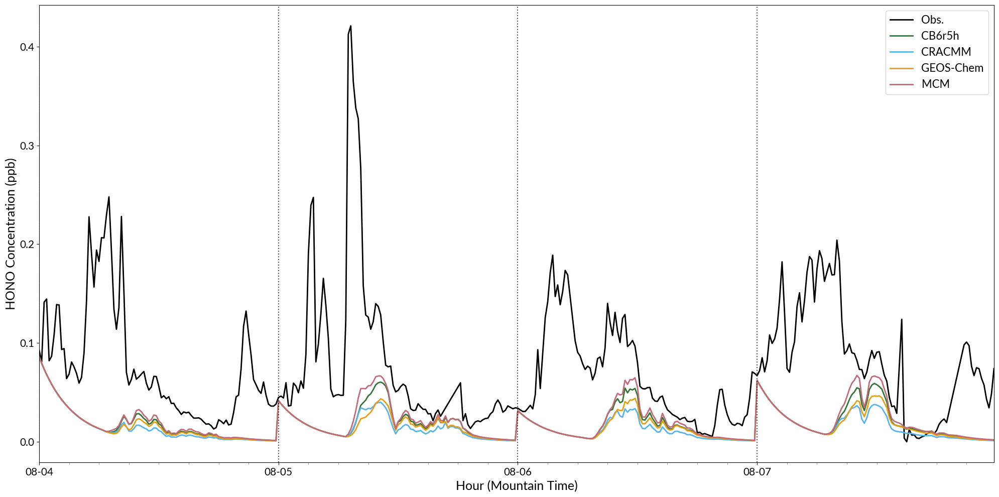

In [152]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['HONOInitconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['HONOconc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['HONOconc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['HNO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['HONOconc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('HONO Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
#plt.savefig(dirpath + '/F0AM_run_analysis/plots/ox_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

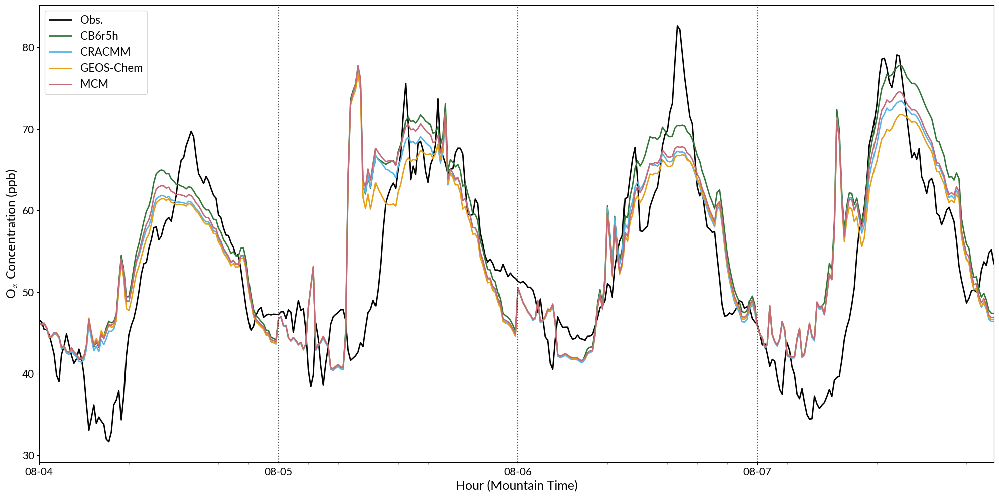

In [153]:
Obs_Ox = df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc']+2*df_CB6r5h_species_conc['NO3Initconc']+3*df_CB6r5h_species_conc['N2O5Initconc']
CB6r5h_Ox = df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc']+2*df_CB6r5h_species_conc['NO3conc']+3*df_CB6r5h_species_conc['N2O5conc']
CRACMM_Ox = df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc']+2*df_CRACMM_species_conc['NO3conc']+3*df_CRACMM_species_conc['N2O5conc']
GEOSChem_Ox = df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc']+2*df_GEOSChem_species_conc['NO3conc']+3*df_GEOSChem_species_conc['N2O5conc']
MCM_Ox = df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc']+2*df_MCM_species_conc['NO3conc']+3*df_MCM_species_conc['N2O5conc']

fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['O3Initconc']+df_CB6r5h_species_conc['NO2Initconc']+2*df_CB6r5h_species_conc['NO3Initconc']+3*df_CB6r5h_species_conc['N2O5Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['O3conc']+df_CB6r5h_species_conc['NO2conc']+2*df_CB6r5h_species_conc['NO3conc']+3*df_CB6r5h_species_conc['N2O5conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['O3conc']+df_CRACMM_species_conc['NO2conc']+2*df_CRACMM_species_conc['NO3conc']+3*df_CRACMM_species_conc['N2O5conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['O3conc']+df_GEOSChem_species_conc['NO2conc']+2*df_GEOSChem_species_conc['NO3conc']+3*df_GEOSChem_species_conc['N2O5conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['O3conc']+df_MCM_species_conc['NO2conc']+2*df_MCM_species_conc['NO3conc']+3*df_MCM_species_conc['N2O5conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('O$_x$ Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/ox_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

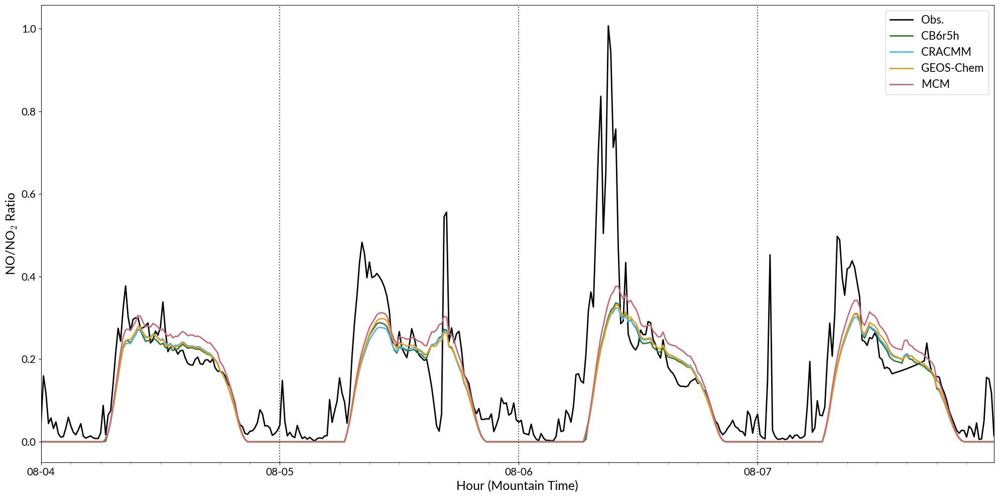

In [154]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['NOInitconc']/df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['NOconc']/df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['NOconc']/df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['NOconc']/df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['NOconc']/df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('NO/NO$_2$ Ratio')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/no_no2_ratio_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

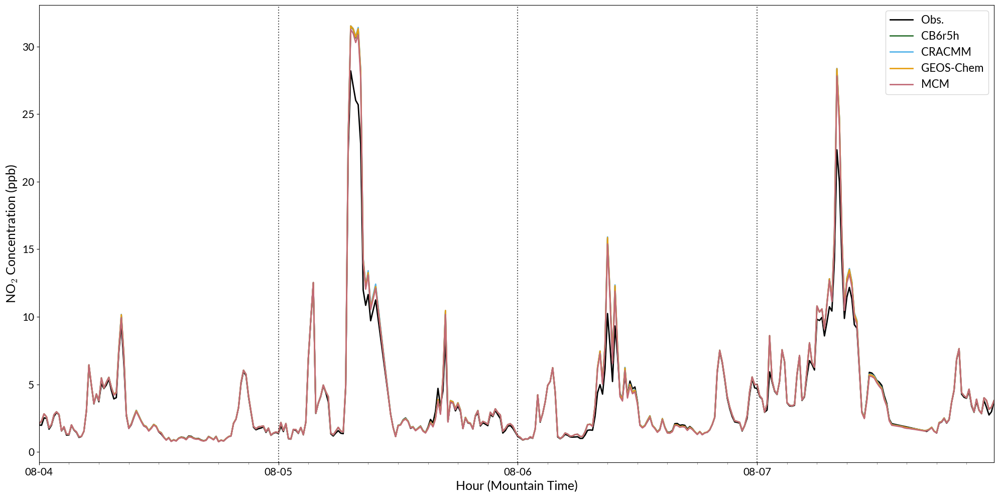

In [155]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['NO2Initconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['NO2conc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['NO2conc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['NO2conc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['NO2conc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('NO$_2$ Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/no2_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

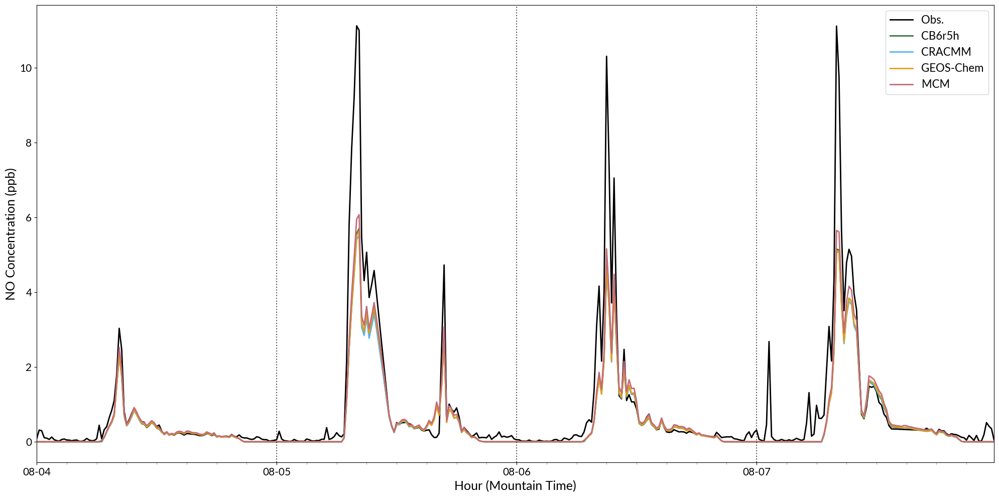

In [156]:
fig, ax = plt.subplots(figsize = (20,10), layout = 'tight')
plt.rcParams['figure.figsize'] = [1.618 * i for i in plt.rcParams['figure.figsize']]

plt.plot(new_index, df_CB6r5h_species_conc['NOInitconc'], label = 'Obs.', linestyle = 'solid', linewidth = 2, color = 'black')
plt.plot(new_index, df_CB6r5h_species_conc['NOconc'], label = 'CB6r5h', linestyle = 'solid', linewidth = 2, color = four_colorset1[0].tolist())
plt.plot(new_index, df_CRACMM_species_conc['NOconc'], label = 'CRACMM', linestyle = 'solid', linewidth = 2, color = four_colorset1[1].tolist())
plt.plot(new_index, df_GEOSChem_species_conc['NOconc'], label = 'GEOS-Chem', linestyle = 'solid', linewidth = 2, color = four_colorset1[2].tolist())
plt.plot(new_index, df_MCM_species_conc['NOconc'], label = 'MCM', linestyle = 'solid', linewidth = 2, color = four_colorset1[3].tolist())

#Mark midnight for every day
midnight_vals = []
for midnight_idx in range(0,len(new_index),96):
    midnight_vals.append(new_index[midnight_idx])
for day_pos in midnight_vals:
    ax.axvline(day_pos, color = 'black', linestyle = 'dotted', alpha = 0.7)

ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# Minor ticks: every 3 hours
ax.xaxis.set_minor_locator(mdates.HourLocator(byhour=[0, 3, 6, 9, 12, 15, 18, 21]))
# Rotate and format tick labels
ax.tick_params(axis='x', which='major')
ax.tick_params(axis='x', which='minor', length=3, color='gray')

plt.xlabel('Hour (Mountain Time)')
# plt.xticks(np.arange(0,24))
plt.margins(x=0)

plt.ylabel('NO Concentration (ppb)')
plt.legend()
#plt.title('Ozone Between Chemical Mechanisms \nfor July 19, 2024\n')
plt.savefig(dirpath + '/F0AM_run_analysis/plots/no_conc_mechanism_comparison_timeseries_08042024_08072024.png', dpi =150)
plt.show()

## Mean Bias Ozone

2.8100040275449167
[0.2, 0.4588235294117647, 0.2196078431372549]
1.4740205768055648
[0.33725490196078434, 0.7058823529411765, 0.9137254901960784]
1.0206210430820153
[0.9019607843137255, 0.6235294117647059, 0.0784313725490196]
1.9271985957975613
[0.7607843137254902, 0.41568627450980394, 0.4666666666666667]


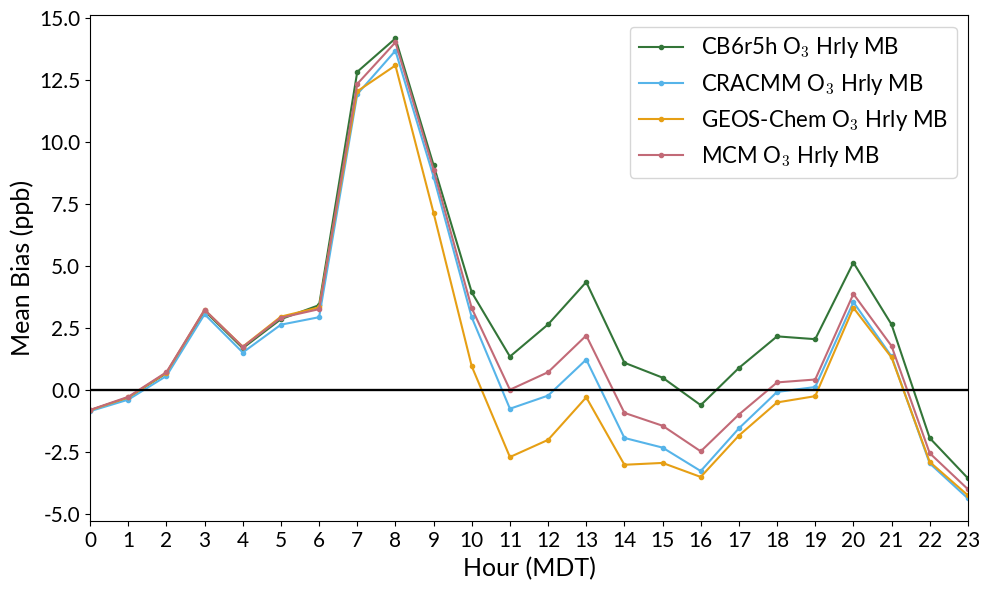

In [24]:
df_o3 = pd.DataFrame({'obs':df_CB6r5h_hrly_species_conc['O3Initconc'], 'CB6r5h':df_CB6r5h_hrly_species_conc['O3conc'], 'CRACMM':df_CRACMM_hrly_species_conc['O3conc'], 'GEOS-Chem':df_GEOSChem_hrly_species_conc['O3conc'], 'MCM':df_MCM_hrly_species_conc['O3conc']})
mech_varlist = ['CB6r5h', 'CRACMM', 'GEOS-Chem', 'MCM']

plt.figure(figsize=(10,6), tight_layout = True)
for mech_var in mech_varlist:
    df_o3['O3_diff']= df_o3[mech_var]-df_o3['obs']
    mb_total = df_o3['O3_diff'].dropna().mean()
    print(mb_total)

    df_o3['hour']=df_o3.index.hour
    hourly_MB = df_o3.groupby(df_o3.index.hour)['O3_diff'].mean()

    if mech_var == 'CB6r5h':
        color_val = four_colorset1[0].tolist()
    elif mech_var == 'CRACMM':
        color_val = four_colorset1[1].tolist()
    elif mech_var == 'GEOS-Chem':
        color_val = four_colorset1[2].tolist()
    elif mech_var == 'MCM':
        color_val = four_colorset1[3].tolist()
    else:
        print('Mechanism name invalid')

    print(color_val)
    # Plot the hourly Mean Bias and the average over time: 
    plt.plot(hourly_MB.index, hourly_MB, color=color_val, marker='.', label=f"{mech_var} O$_3$ Hrly MB")
    plt.hlines(y=0, xmin=hourly_MB.index[0], xmax= hourly_MB.index[len(hourly_MB)-1], linestyle='solid', color = 'k')
    # plt.plot(hourly_MB.index, np.ones(len(hourly_MB.index))*mb_total, linestyle = 'dashed', color=color_val,label=f"Avg. MB={mb_total:.2f} ppb")
    #plt.fill_between(hourly_MB.index, -1.5, 1.5,  color = 'm', alpha = 0.2, label = 'Instrum. Uncertainty = $\pm$ 1.5 ppb')

    #plt.ylim([-0.14, 0])
    #plt.title('Mean Bias')
    plt.ylabel('Mean Bias (ppb)')
    plt.xlabel('Hour (MDT)')
    plt.xlim([0, 23])
    plt.xticks(hour_range)
    #plt.yticks(np.arange(-7, 3, 1))
    plt.grid()
    plt.legend(loc='upper right')
    plt.savefig(dirpath + '/F0AM_run_analysis/plots/hrly_mean_bias_ozone_mechanism_comparison_timeseries_08042024_08072024.png', dpi =300)
plt.show()